In [1]:
    # TUMOR TYPES
    #"0" : nolabel,
    # "1" : neoplastic ,
    # "2"  : inflammatory,
    # "3" : connective,
    # "4" : dead/necrosis,
    # "5" : epithelial

#For simultaneous instance segmentation and classification, patches are stored as a 5 dimensional numpy array with channels [RGB, inst, type]
# Here, type is the ground truth of the nuclear type. i.e every pixel ranges from 0-K, where 0 is background and K is the number of classes

In [2]:
from __future__ import print_function, unicode_literals, absolute_import, division
import sys
import numpy as np
import matplotlib
matplotlib.rcParams["image.interpolation"] = None
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from glob import glob
import json
from tqdm import tqdm
from tifffile import imread
from csbdeep.utils import Path, normalize

from nurisc import fill_label_holes, random_label_cmap, calculate_extents, gputools_available
from nurisc.matching import matching, matching_dataset
from nurisc.models import Config2D, nurisc2D, nuriscData2D
from nurisc.utils import mask_to_categorical
from nurisc.plot import render_label


np.random.seed(0)
lbl_cmap = random_label_cmap()
lbl_cmap_classes = matplotlib.cm.tab10

def plot_img_label(img, lbl, cls_dict, n_classes=5, img_title="image", lbl_title="label", cls_title="classes", **kwargs):
    c = mask_to_categorical(lbl, n_classes=n_classes, classes=cls_dict)
    res = np.zeros(lbl.shape, np.uint16)
    for i in range(1,c.shape[-1]):
        m = c[...,i]>0
        res[m] = i
    class_img = lbl_cmap_classes(res)
    # class_img[...,:3][res==0] = 0
    # class_img[...,-1][res==0] = 1

    fig, (ai,al,ac) = plt.subplots(1,3, figsize=(17,7), gridspec_kw=dict(width_ratios=(1.,1,1)))
    im = ai.imshow(img, cmap='gray')
    #fig.colorbar(im, ax = ai)
    ai.set_title(img_title)
    al.imshow(render_label(lbl, .3*normalize(img, clip=True), normalize_img=False, alpha_boundary=.8,cmap=lbl_cmap))
    al.set_title(lbl_title)
    ac.imshow(class_img)
    ac.imshow(render_label(res, .3*normalize(img, clip=True), normalize_img=False, alpha_boundary=.8, cmap=lbl_cmap_classes))
    ac.set_title(cls_title)
    plt.tight_layout()
    for a in ai,al,ac:
        a.axis("off")
    return ai,al,ac

C:\Users\es255022\AppData\Local\Temp\ipykernel_4408\2403022445.py:5: MatplotlibDeprecationWarning: Support for setting an rcParam that expects a str value to a non-str value is deprecated since 3.5 and support will be removed two minor releases later.
  matplotlib.rcParams["image.interpolation"] = None


Instructions for updating:
Use `tf.config.run_functions_eagerly` instead of the experimental version.
Model: "denseUnet_fNLA"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 528, 240, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv00_block1_conv (Conv2D)    (None, 528, 240, 5)  45          ['input_1[0][0]']                
                                                                                                  
 conv00_block1_bn (BatchNormali  (None, 528, 240, 5)  35         ['conv00_block1_conv[0][0]']     
 zation)                                                                          

nadam.py (78): The `lr` argument is deprecated, use `learning_rate` instead.


                                                                                                  
 conv20_block11_2_bn (BatchNorm  (None, 132, 60, 5)  35          ['conv20_block11_2_conv[0][0]']  
 alization)                                                                                       
                                                                                                  
 conv20_block11_2_actv (Activat  (None, 132, 60, 5)  0           ['conv20_block11_2_bn[0][0]']    
 ion)                                                                                             
                                                                                                  
 conv20_block11_drop (Dropout)  (None, 132, 60, 5)   0           ['conv20_block11_2_actv[0][0]']  
                                                                                                  
 conv20_block11_concat (Concate  (None, 132, 60, 75)  0          ['conv20_block10_concat[0][0]',  
 nate)    

In [3]:
# import numpy as np
# import os
# import normalizeStaining as NS
#
# images_1= np.load('C:/Users/es255022/OneDrive - Teradata/Desktop/Dataset/pannuke/fold_1/images/fold1/images.npy')
# masks_1= np.load('C:/Users/es255022/OneDrive - Teradata/Desktop/Dataset/pannuke/fold_1/masks/fold1/masks.npy')
# images_2= np.load('C:/Users/es255022/OneDrive - Teradata/Desktop/Dataset/pannuke/fold_2/images/fold2/images.npy')
# masks_2= np.load('C:/Users/es255022/OneDrive - Teradata/Desktop/Dataset/pannuke/fold_2/masks/fold2/masks.npy')
# images_3= np.load('C:/Users/es255022/OneDrive - Teradata/Desktop/Dataset/pannuke/fold_3/images/fold3/images.npy')
# masks_3= np.load('C:/Users/es255022/OneDrive - Teradata/Desktop/Dataset/pannuke/fold_3/masks/fold3/masks.npy')
#
#
# out_dir='C:/Users/es255022/OneDrive - Teradata/Desktop/Dataset/pannuke_check/'
# # A helper function to map 2d numpy array
# def flat_for(a, f):
#     a = a.reshape(-1)
#     for i, v in enumerate(a):
#         a[i] = f(v)
#
#
# # A helper function to unique PanNuke instances indexes to [0..N] range where 0 is background
# def map_inst(inst):
#     seg_indexes = np.unique(inst)
#     new_indexes = np.array(range(0, len(seg_indexes)))
#     dict = {}
#     for seg_index, new_index in zip(seg_indexes, new_indexes):
#         dict[seg_index] = new_index
#
#     flat_for(inst, lambda x: dict[x])
#
#
# # A helper function to transform PanNuke format to HoverNet data format
# def transform(images, masks, path, out_dir, norm = False):
#     try:
#         os.mkdir(out_dir)
#     except FileExistsError:
#         pass
#
#     fold_path = out_dir+path
#     try:
#         os.mkdir(fold_path)
#     except FileExistsError:
#         pass
#
#     for i in range(images.shape[0]):
#         stop = False
#         np_file = np.zeros((256,256,5), dtype='int16')
#
#         # add rgb channels to array
#         img_int = np.array(images[i],np.int16)
#         for j in range(3):
#             np_file[:,:,j] = img_int[:,:,j]
#
#         if norm:
#
#             #Normailze stain
#             try:
#                 Inorm, H, E = NS.normalizeStaining(np.array(np_file[:,:,:3],np.int16))
#                 for rgb in range(3):
#                     np_file[:,:,rgb] = Inorm[:,:,rgb]
#
#             except:
#                 print("file %d not normalized" % (i+1))
#                 stop = True
#
#
#         # convert inst and type format for mask
#         msk = masks[i]
#
#         inst = np.zeros((256,256))
#         for j in range(5):
#             #copy value from new array if value is not equal 0
#             inst = np.where(msk[:,:,j] != 0, msk[:,:,j], inst)
#         map_inst(inst)
#
#         types = np.zeros((256,256))
#         for j in range(5):
#             # write type index if mask is not equal 0 and value is still 0
#             types = np.where((msk[:,:,j] != 0) & (types == 0), j+1, types)
#
#         # add padded inst and types to array
#         np_file[:,:,3] = inst
#         np_file[:,:,4] = types
#         if stop == False:
#             np.save(fold_path +'/'+path+'_%d.npy' % (i+1), np_file)
#             print('file %d saved' % (i+1))
#
# # For the correct evaluation we need to keep training, validation and test folds
# transform(images_1, masks_1, 'fold1', out_dir=out_dir, norm=True)
# transform(images_2, masks_2, 'fold2', out_dir=out_dir, norm=True)
# transform(images_3, masks_3, 'fold3', out_dir=out_dir, norm=True)
# print("done")

In [4]:
#-------------------Training Data-----------------------------------------
train_data = sorted(glob('C:/Users/es255022/OneDrive - Teradata/Desktop/Dataset/pannuke_check/fold1/*.npy'))
trn_data = list(map(np.load,train_data))

X_trn=[x[...,(0,1,2)] for x in trn_data]
Y_trn=[y[...,3].astype(int) for y in trn_data]
Y1=[y[...,3].astype(int) for y in trn_data]
cls_dict=[cls[...,4]for cls in trn_data]

# Y3 = [[0 for x in range(65536)] for y in range(len(trn_data))]
# for i in range(len(trn_data)):
#     Y3[i]=Y1[i].flatten()
# CL3 = [[0 for x in range(66536)] for y in range(len(trn_data))]
# for i in range(len(trn_data)):
#     CL3[i]=cls_dict[i].flatten()
cls_trn=[]
for i in range(len(trn_data)):
    cls_trn.append(dict(zip(Y1[i].flatten(), cls_dict[i].flatten())))

#-------------------Validation Data-----------------------------------------
valid_data = sorted(glob('C:/Users/es255022/OneDrive - Teradata/Desktop/Dataset/pannuke_check/fold2/*.npy'))
val_data = list(map(np.load,valid_data))

X_val=[x[...,(0,1,2)] for x in val_data]
Y_val=[y[...,3].astype(int) for y in val_data]

#----------temporary variable for class dictionary creation-----------
Y1=[y[...,3].astype(int) for y in val_data]
cls_dict=[cls[...,4]for cls in val_data]
cls_val=[]
for i in range(len(val_data)):
    cls_val.append(dict(zip(Y1[i].flatten(), cls_dict[i].flatten())))

   #-------------------Testing Data-----------------------------------------
test_data = sorted(glob('C:/Users/es255022/OneDrive - Teradata/Desktop/Dataset/pannuke_check/fold3/*.npy'))
tst_data = list(map(np.load,test_data))
X_tst=[x[...,(0,1,2)] for x in tst_data]
Y_tst=[y[...,3].astype(int)for y in tst_data]
#----------temporary variable for class dictionary creation-----------
Y1=[y[...,3].astype(int) for y in tst_data]
cls_dict=[cls[...,4]for cls in tst_data]
cls_tst=[]
for i in range(len(tst_data)):
    cls_tst.append(dict(zip(Y1[i].flatten(), cls_dict[i].flatten())))

# cls=(*my_cls,)
n_channel = 1 if X_trn[0].ndim == 2 else X_trn[0].shape[-1]

Normalize images and fill small label holes.

In [5]:
axis_norm = (0,1)   # normalize channels independently
# axis_norm = (0,1,2) # normalize channels jointly
if n_channel > 1:
    print("Normalizing image channels %s." % ('jointly' if axis_norm is None or 2 in axis_norm else 'independently'))
    sys.stdout.flush()

X_trn = [normalize(x,1,99.8,axis=axis_norm) for x in tqdm(X_trn)]
Y_trn = [fill_label_holes(y) for y in tqdm(Y_trn)]
X_val = [normalize(x,1,99.8,axis=axis_norm) for x in tqdm(X_val)]
Y_val = [fill_label_holes(y) for y in tqdm(Y_val)]
X_tst = [normalize(x,1,99.8,axis=axis_norm) for x in tqdm(X_tst)]
Y_tst = [fill_label_holes(y) for y in tqdm(Y_tst)]

Normalizing image channels independently.


100%|██████████| 2703/2703 [00:05<00:00, 480.82it/s]


Split into train and validation datasets.

In [6]:
X_tst = [normalize(x,1,99.8,axis=axis_norm) for x in tqdm(X_tst)]
Y_tst = [fill_label_holes(y) for y in tqdm(Y_tst)]

100%|██████████| 2703/2703 [00:05<00:00, 485.97it/s]


Training data consists of pairs of input image and label instances.

In [7]:
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
cmap = ListedColormap(["pink", "red", "green","blue" ,"yellow", "darkorange"])


In [9]:
np.random.seed(0)
lbl_cmap = ListedColormap(["lime"])
lbl_cmap_classes = cmap

def plot_img_label(img, lbl, cls_dict, n_classes=6, img_title="image", lbl_title="label", cls_title="classes", **kwargs):
    c = mask_to_categorical(lbl, n_classes=n_classes, classes=cls_dict)
    res = np.zeros(lbl.shape, np.uint16)
    for i in range(1,c.shape[-1]):
        m = c[...,i]>0
        res[m] = i
    class_img = lbl_cmap_classes(res)
    # class_img[...,:3][res==0] = 0
    # class_img[...,-1][res==0] = 1

    fig, (ai,al,ac) = plt.subplots(1,3, figsize=(17,7), gridspec_kw=dict(width_ratios=(1.,1,1)))
    im = ai.imshow(img, cmap='gray')
    #fig.colorbar(im, ax = ai)
    ai.set_title(img_title)
    al.imshow(render_label(lbl, .99*normalize(img, clip=True), normalize_img=False, alpha_boundary=.8,cmap=lbl_cmap))
    al.set_title(lbl_title)
    ac.imshow(class_img)
    ac.imshow(render_label(res, .99*normalize(img, clip=True), normalize_img=False, alpha_boundary=.8, cmap=lbl_cmap_classes))
    ac.set_title(cls_title)
    plt.tight_layout()
    for a in ai,al,ac:
        a.axis("off")
    return ai,al,ac

In [ ]:
ax4 = plot_img_label(X_tst[245],Y_tst[245],cls_tst[245], n_classes=5)
ax4 = plot_img_label(X_tst[1290],Y_tst[1290],cls_tst[1290], n_classes=5)
ax4 = plot_img_label(X_tst[1700],Y_tst[1700],cls_tst[1700], n_classes=5)

In [ ]:
ax = plot_img_label(X_trn[1400],Y_trn[1400],cls_trn[1400], n_classes=6)
ax1 = plot_img_label(X_trn[1600],Y_trn[1600],cls_trn[1600], n_classes=6)
ax2 = plot_img_label(X_val[500],Y_val[500],cls_val[500], n_classes=6)
ax3 = plot_img_label(X_val[245],Y_val[245],cls_val[245], n_classes=6)





In [5]:
print(Config2D.__doc__)

Configuration for a :class:`nurisc2D` model.

    Parameters
    ----------
    axes : str or None
        Axes of the input images.
    n_rays : int
        Number of radial directions for the nuclei.
    n_channel_in : int
        Number of channels of given input image (default: 1).

    grid : (int,int)
        Subsampling factors (must be powers of 2) for each of the axes.
        Model will predict on a subsampled grid for increased efficiency and larger field of view.
    n_classes : None or int
        Number of object classes to use for multi-class prediction (use None to disable)
    backbone : str
        Name of the neural network architecture to be used as backbone.
    kwargs : dict
        Overwrite (or add) configuration attributes (see below).


    Attributes
    ----------
    unet_n_depth : int
        Number of U-Net resolution levels (down/up-sampling layers).
    unet_kernel_size : (int,int)
        Convolution kernel size for all (U-Net) convolution layers.
    

### Multi-class model

* Set the `n_classes` variable to the number of object classes in the `Config` object.
* Set the `classes` variable in `model.train` to a list of class dictionaries for every training image/label pair.

In [9]:
import math


def get_class_weight(labels_dict):

    total = sum(labels_dict.values())
    max_num = max(labels_dict.values())
    mu = 1.0 / (total / max_num)
    class_weight = dict()
    for key, value in labels_dict.items():
        score = math.log(mu * total / float(value))
        class_weight[key] = score if score > 1.0 else 1.0
    return class_weight


labels_dict = {0: 137612655, 1: 13018097
, 2: 3012256
, 3: 6335664
, 4: 103961
 , 5:4216119

}
print(get_class_weight(labels_dict))
# {0: 1.0, 1: 1.0, 2: 1.0, 3: 1.0, 4: 1.0}
# labels_dict = {0: 5, 1: 78, 2: 2814, 3: 7914}
# print(get_class_weight(labels_dict))

{0: 1.0, 1: 2.3581024244032336, 2: 3.8217535910612446, 3: 3.078248267944116, 4: 7.188182340917902, 5: 3.485527854099882}


In [12]:
# 32 is a good default choice
n_rays = 36
n_classes=5
# Use OpenCL-based computations for data generator during training (requires 'gputools')
use_gpu = True and gputools_available()

# Predict on subsampled grid for increased efficiency and larger field of view
grid = (1,1)

conf = Config2D (
    n_rays       = n_rays,
    grid         = grid,
    use_gpu      = True,
    n_channel_in = n_channel,
    n_classes    = n_classes,
   # train_class_weights=(1,2.3581024244032336,3.8217535910612446,3.078248267944116,7.188182340917902,3.485527854099882),
   #  train_class_loss='cce_dice',
    train_batch_size=4,
    backbone='ffnet',
    # train_learning_rate=0.0001
    # set the number of object classes
)
print(conf)
vars(conf)

If you want to compute separable approximations, please install it with
pip install scikit-tensor-py3
Config2D(n_dim=2, axes='YXC', n_channel_in=3, n_channel_out=37, train_checkpoint='weights_best.h5', train_checkpoint_last='weights_last.h5', train_checkpoint_epoch='weights_now.h5', n_rays=36, grid=(1, 1), backbone='ffnet', n_classes=5, unet_n_depth=4, unet_kernel_size=(3, 3), unet_n_filter_base=32, unet_n_conv_per_depth=2, unet_pool=(2, 2), unet_activation='relu', unet_last_activation='relu', unet_batch_norm=True, unet_dropout=0.0, unet_prefix='', net_conv_after_unet=128, head_blocks=2, net_input_shape=(None, None, 3), net_mask_shape=(None, None, 1), train_shape_completion=False, train_completion_crop=32, train_patch_size=(256, 256), train_background_reg=0.0001, train_foreground_only=0.9, train_sample_cache=True, train_dist_loss='mae', train_class_loss='cce_tversky', train_loss_weights=(1, 0.2, 1), train_class_weights=(1, 1, 1, 1, 1, 1), train_epochs=400, train_steps_per_epoch=100, tr

{'n_dim': 2,
 'axes': 'YXC',
 'n_channel_in': 3,
 'n_channel_out': 37,
 'train_checkpoint': 'weights_best.h5',
 'train_checkpoint_last': 'weights_last.h5',
 'train_checkpoint_epoch': 'weights_now.h5',
 'n_rays': 36,
 'grid': (1, 1),
 'backbone': 'ffnet',
 'n_classes': 5,
 'unet_n_depth': 4,
 'unet_kernel_size': (3, 3),
 'unet_n_filter_base': 32,
 'unet_n_conv_per_depth': 2,
 'unet_pool': (2, 2),
 'unet_activation': 'relu',
 'unet_last_activation': 'relu',
 'unet_batch_norm': True,
 'unet_dropout': 0.0,
 'unet_prefix': '',
 'net_conv_after_unet': 128,
 'head_blocks': 2,
 'net_input_shape': (None, None, 3),
 'net_mask_shape': (None, None, 1),
 'train_shape_completion': False,
 'train_completion_crop': 32,
 'train_patch_size': (256, 256),
 'train_background_reg': 0.0001,
 'train_foreground_only': 0.9,
 'train_sample_cache': True,
 'train_dist_loss': 'mae',
 'train_class_loss': 'cce_tversky',
 'train_loss_weights': (1, 0.2, 1),
 'train_class_weights': (1, 1, 1, 1, 1, 1),
 'train_epochs': 4

In [9]:
use_gpu=True

In [10]:
if use_gpu:
    from csbdeep.utils.tf import limit_gpu_memory
    limit_gpu_memory(None, allow_growth=True)
    # alternatively, adjust as necessary: limit GPU memory to be used by TensorFlow to leave some to OpenCL-based computations
    # limit_gpu_memory(0.8)

In [13]:

model1 = nurisc2D(config=None, name='ffnet_pannuke', basedir='C:\/Users/es255022/Downloads/')

Loading network weights from 'weights_best_!.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.482317, nms_thresh=0.3.


In [14]:
model = nurisc2D(config=None, name='pannuke', basedir='C:/Users/es255022/OneDrive - Teradata/Desktop/')

Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.468769, nms_thresh=0.3.


In [15]:
median_size = calculate_extents(list(Y_trn), np.median)
fov = np.array(model._axes_tile_overlap('YX'))
print(f"median object size:      {median_size}")
print(f"network field of view :  {fov}")
if any(median_size > fov):
    print("WARNING: median object size larger than field of view of the neural network.")

structured_function.py (264): Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.


1/1 [==============================] - 0s 183ms/step
median object size:      [25. 25.]
network field of view :  [128 128]


In [15]:
n_classes=5
def random_fliprot(img, mask):
    assert img.ndim >= mask.ndim
    axes = tuple(range(mask.ndim))
    perm = tuple(np.random.permutation(axes))
    img = img.transpose(perm + tuple(range(mask.ndim, img.ndim)))
    mask = mask.transpose(perm)
    for ax in axes:
        if np.random.rand() > 0.5:
            img = np.flip(img, axis=ax)
            mask = np.flip(mask, axis=ax)
    return img, mask

def random_intensity_change(img):
    img = img*np.random.uniform(0.6,2) + np.random.uniform(-0.2,0.2)
    return img


def augmenter(x, y):

    x, y = random_fliprot(x, y)
    x = random_intensity_change(x)
    # add some gaussian noise
    sig = 0.02*np.random.uniform(0,1)
    x = x + sig*np.random.normal(0,1,x.shape)
    return x, y

In [ ]:
# plot some augmented examples

img, lbl, cls = X_trn[0], Y_trn[0], cls_trn[0]
plot_img_label(img,lbl,cls, n_classes=5)
for _ in range(3):
    img_aug, lbl_aug = augmenter(img,lbl)
    plot_img_label(img_aug,lbl_aug,cls, img_title="image augmented", lbl_title="label augmented", n_classes=n_classes)

In [ ]:
model.train(X_trn,Y_trn, classes=cls_trn, validation_data=(X_val,Y_val,cls_val),augmenter=augmenter,
           epochs=50, steps_per_epoch=64)


In [ ]:

model.optimize_thresholds(X_val, Y_val)

# Evaluation and Detection Performance

Predict for a single example image first.

In [28]:
lbl_cmap_classes = matplotlib.cm.Set1

In [24]:
# lbl_cmap_classes = matplotlib.cm.tab10_r
def plot_img_label1(img, lbl, cls_dict, n_classes=6, img_title="image", lbl_title="label", cls_title="classes", **kwargs):
    c = mask_to_categorical(lbl, n_classes=n_classes, classes=cls_dict)
    res = np.zeros(lbl.shape, np.uint16)
    for i in range(1,c.shape[-1]):
        m = c[...,i]>0
        res[m] = i
    class_img = lbl_cmap_classes(res)
    # class_img[...,:3][res==0] = 0
    # class_img[...,-1][res==0] = 1

    fig, (ai,al,ac) = plt.subplots(1,3, figsize=(17,7), gridspec_kw=dict(width_ratios=(1.,1,1)))
    im = ai.imshow(img, cmap='gray')
    #fig.colorbar(im, ax = ai)
    ai.set_title(img_title)
    al.imshow(render_label(lbl, normalize_img=False, alpha_boundary=.8,cmap='prism'))
    al.set_title(lbl_title)
    ac.imshow(class_img)
    ac.imshow(render_label(res, normalize_img=False, alpha_boundary=.8, cmap=lbl_cmap_classes))
    ac.set_title(cls_title)
    plt.tight_layout()
    for a in ai,al,ac:
        a.axis("off")
    return ai,al,ac

In [17]:
# the class object ids are stored in the 'results' dict and correspond to the label ids in increasing order 
def class_from_res(res):
    cls_dict = dict((i+1,c) for i,c in enumerate(res['class_id']))
    return cls_dict



In [31]:
def plot_img_label(img, lbl, cls_dict, n_classes=5, img_title="image", lbl_title="label", cls_title="classes", **kwargs):
    c = mask_to_categorical(lbl, n_classes=n_classes, classes=cls_dict)
    res = np.zeros(lbl.shape, np.uint16)
    for i in range(1,c.shape[-1]):
        m = c[...,i]>0
        res[m] = i
    class_img = lbl_cmap_classes(res)
    # class_img[...,:3][res==0] = 0
    # class_img[...,-1][res==0] = 1

    fig, (ai,al,ac) = plt.subplots(1,3, figsize=(17,7), gridspec_kw=dict(width_ratios=(1.,1,1)))
    im = ai.imshow(img, cmap='gray')
    #fig.colorbar(im, ax = ai)
    ai.set_title(img_title)
    al.imshow(render_label(lbl, .3*normalize(img, clip=True), normalize_img=False, alpha_boundary=.8,cmap=matplotlib.cm.tab10))
    al.set_title(lbl_title)



    ac.imshow(class_img)
    ac.imshow(render_label(res, .3*normalize(img, clip=True), normalize_img=False, alpha_boundary=.8, cmap=lbl_cmap_classes))
    ac.set_title(cls_title)
    plt.tight_layout()
    for a in ai,al,ac:
        a.axis("off")
    return ai,al,ac

1/1 [==============================] - 0s 202ms/step


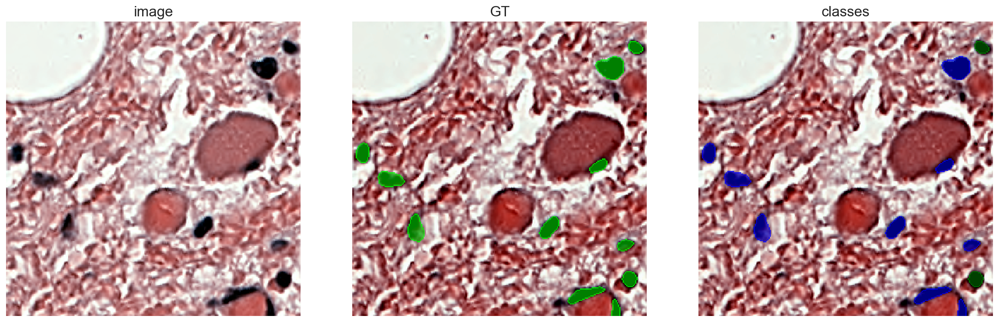

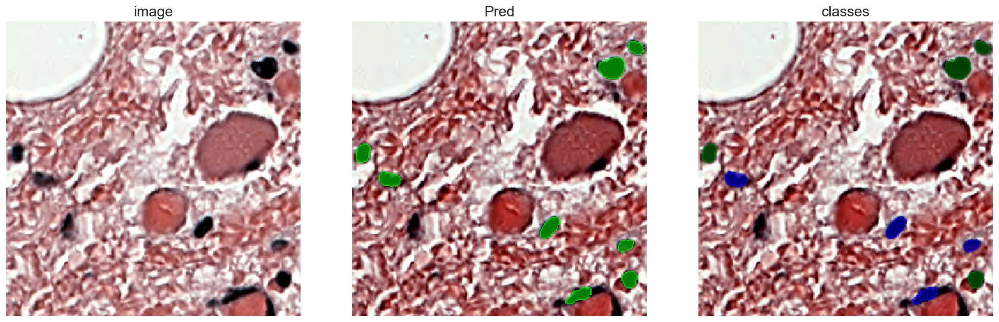

In [18]:
i3=1000
label, res = model.predict_instances(X_val[i3], n_tiles=model._guess_n_tiles(X_val[i3]))
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3],            lbl_title="GT")
plot_img_label(X_val[i3], label,    class_from_res(res), lbl_title="Pred");

structured_function.py (264): Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.


1/1 [==============================] - 1s 711ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


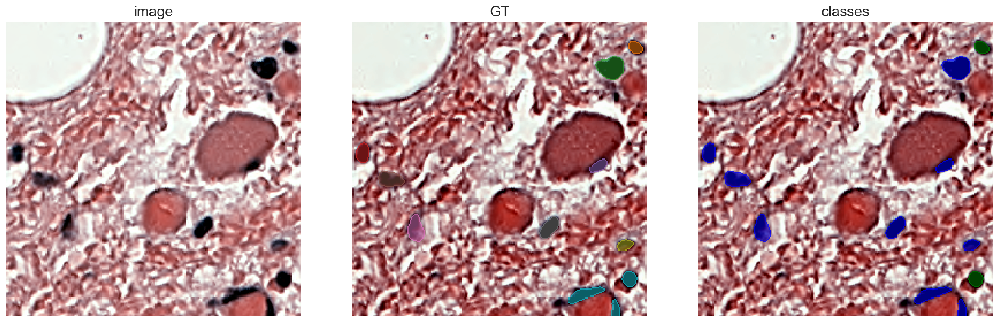

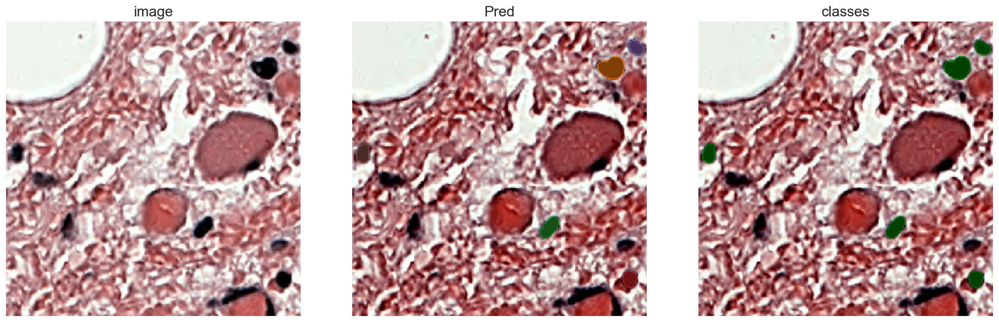

In [22]:
i3=1000
label, res = model1.predict_instances(X_val[i3], n_tiles=model._guess_n_tiles(X_val[i3]))
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3],            lbl_title="GT")
plot_img_label(X_val[i3], label,    class_from_res(res), lbl_title="Pred");

1/1 [==============================] - 0s 194ms/step


NameError: name 'class_from_res' is not defined

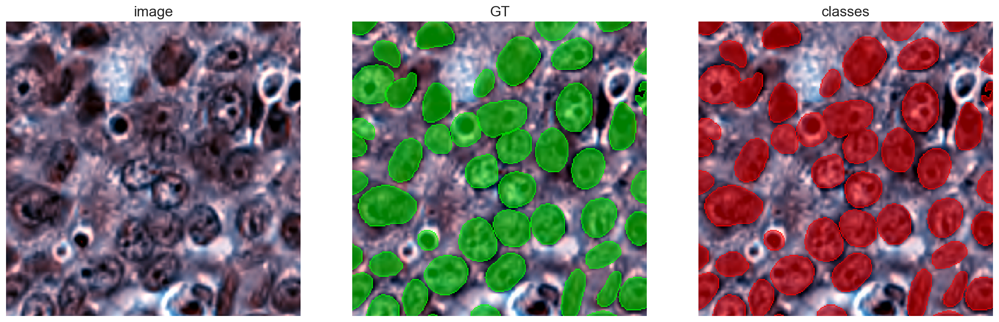

In [16]:
i3=24
label, res = model.predict_instances(X_tst[i3], n_tiles=model._guess_n_tiles(X_tst[i3]))
plot_img_label(X_tst[i3], Y_tst[i3], cls_tst[i3],            lbl_title="GT")
plot_img_label(X_tst[i3], label,    class_from_res(res), lbl_title="Pred");

In [ ]:
i3=50
label, res = model.predict_instances(X_tst[i3], n_tiles=model._guess_n_tiles(X_tst[i3]))
plot_img_label(X_tst[i3], Y_tst[i3], cls_tst[i3],            lbl_title="GT")
plot_img_label(X_tst[i3], label,    class_from_res(res), lbl_title="Pred");

In [ ]:
i3=100
label, res = model.predict_instances(X_tst[i3], n_tiles=model._guess_n_tiles(X_tst[i3]))
plot_img_label(X_tst[i3], Y_tst[i3], cls_tst[i3],            lbl_title="GT")
plot_img_label(X_tst[i3], label,    class_from_res(res), lbl_title="Pred");

In [ ]:
i3=54
label, res = model.predict_instances(X_tst[i3], n_tiles=model._guess_n_tiles(X_tst[i3]))
plot_img_label(X_tst[i3], Y_tst[i3], cls_tst[i3],            lbl_title="GT")
plot_img_label(X_tst[i3], label,    class_from_res(res), lbl_title="Pred");

In [ ]:
i3=480
label, res = model.predict_instances(X_tst[i3], n_tiles=model._guess_n_tiles(X_tst[i3]))
plot_img_label(X_tst[i3], Y_tst[i3], cls_tst[i3],            lbl_title="GT")
plot_img_label(X_tst[i3], label,    class_from_res(res), lbl_title="Pred");

In [ ]:
i3=62
label, res = model.predict_instances(X_tst[i3], n_tiles=model._guess_n_tiles(X_tst[i3]))
plot_img_label(X_tst[i3], Y_tst[i3], cls_tst[i3],            lbl_title="GT")
plot_img_label(X_tst[i3], label,    class_from_res(res), lbl_title="Pred");

In [ ]:

i3=1700
label, res = model.predict_instances(X_val[i3], n_tiles=model._guess_n_tiles(X_val[i3]))
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3],            lbl_title="GT")
plot_img_label(X_val[i3], label,    class_from_res(res), lbl_title="Pred");

In [47]:
# lbl_cmap_classes = matplotlib.cm.tab10_r
def plot_img_label1(img, lbl, cls_dict, n_classes=6, img_title="image", lbl_title="label", cls_title="classes", **kwargs):
    c = mask_to_categorical(lbl, n_classes=n_classes, classes=cls_dict)
    res = np.zeros(lbl.shape, np.uint16)
    for i in range(1,c.shape[-1]):
        m = c[...,i]>0
        res[m] = i
    class_img = lbl_cmap_classes(res)
    # class_img[...,:3][res==0] = 0
    # class_img[...,-1][res==0] = 1

    fig, (ai,al,ac) = plt.subplots(1,3, figsize=(17,7), gridspec_kw=dict(width_ratios=(1.,1,1)))
    im = ai.imshow(img, cmap='gray')
    #fig.colorbar(im, ax = ai)
    ai.set_title(img_title)
    al.imshow(render_label(lbl, normalize_img=False, alpha_boundary=.8,cmap='prism'))
    al.set_title(lbl_title)
    ac.imshow(class_img)
    ac.imshow(render_label(res, normalize_img=False, alpha_boundary=.8, cmap=lbl_cmap_classes))
    ac.set_title(cls_title)
    plt.tight_layout()
    for a in ai,al,ac:
        a.axis("off")
    return ai,al,ac

In [ ]:
i3=1189
label, res = model.predict_instances(X_tst[i3], n_tiles=model._guess_n_tiles(X_tst[i3]))
plot_img_label(X_tst[i3], Y_tst[i3], cls_tst[i3],            lbl_title="GT")
plot_img_label(X_tst[i3], label,    class_from_res(res), lbl_title="Pred");

In [ ]:
i3=119
label, res = model.predict_instances(X_tst[i3], n_tiles=model._guess_n_tiles(X_tst[i3]))
plot_img_label(X_tst[i3], Y_tst[i3], cls_tst[i3],            lbl_title="GT")
plot_img_label(X_tst[i3], label,    class_from_res(res), lbl_title="Pred");

In [ ]:
i3=3
label, res = model.predict_instances(X_tst[i3], n_tiles=model._guess_n_tiles(X_tst[i3]))
plot_img_label(X_tst[i3], Y_tst[i3], cls_tst[i3],            lbl_title="GT")
plot_img_label(X_tst[i3], label,    class_from_res(res), lbl_title="Pred");

In [ ]:
i3=613
label, res = model.predict_instances(X_tst[i3], n_tiles=model._guess_n_tiles(X_tst[i3]))
plot_img_label(X_tst[i3], Y_tst[i3], cls_tst[i3],            lbl_title="GT")
plot_img_label(X_tst[i3], label,    class_from_res(res), lbl_title="Pred");

In [ ]:
i3=485
label, res = model.predict_instances(X_val[i3], n_tiles=model._guess_n_tiles(X_val[i3]))
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3],            lbl_title="GT")
plot_img_label(X_val[i3], label,    class_from_res(res), lbl_title="Pred");

In [ ]:
i3=391
label, res = model.predict_instances(X_val[i3], n_tiles=model._guess_n_tiles(X_val[i3]))
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3],            lbl_title="GT")
plot_img_label(X_val[i3], label,    class_from_res(res), lbl_title="Pred");

In [ ]:
i3=89
label, res = model.predict_instances(X_val[i3], n_tiles=model._guess_n_tiles(X_val[i3]))
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3],            lbl_title="GT")
plot_img_label(X_val[i3], label,    class_from_res(res), lbl_title="Pred");

In [ ]:
i3=784
label, res = model.predict_instances(X_val[i3], n_tiles=model._guess_n_tiles(X_val[i3]))
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3],            lbl_title="GT")
plot_img_label(X_val[i3], label,    class_from_res(res), lbl_title="Pred");

In [ ]:
i3=1362
label, res = model.predict_instances(X_val[i3], n_tiles=model._guess_n_tiles(X_val[i3]))
plot_img_label1(X_val[i3], Y_val[i3], cls_val[i3],            lbl_title="GT")
plot_img_label1(X_val[i3], label,    class_from_res(res), lbl_title="Pred");

In [ ]:
i3=786
label, res = model.predict_instances(X_tst[i3], n_tiles=model._guess_n_tiles(X_tst[i3]))
label1, res1 = model1.predict_instances(X_tst[i3], n_tiles=model1._guess_n_tiles(X_tst[i3]))
plot_img_label(X_tst[i3], Y_tst[i3], cls_tst[i3],            lbl_title="GT")
plot_img_label(X_tst[i3], label,    class_from_res(res), lbl_title="Pred");
plot_img_label(X_tst[i3], label1,    class_from_res(res1), lbl_title="Pred");

In [ ]:
i3=1362
label, res = model.predict_instances(X_tst[i3], n_tiles=model._guess_n_tiles(X_tst[i3]))
label1, res1 = model1.predict_instances(X_tst[i3], n_tiles=model1._guess_n_tiles(X_tst[i3]))
plot_img_label(X_tst[i3], Y_tst[i3], cls_tst[i3],            lbl_title="GT")
plot_img_label(X_tst[i3], label,    class_from_res(res), lbl_title="Pred");
plot_img_label(X_tst[i3], label1,    class_from_res(res1), lbl_title="Pred");

In [ ]:
i3=600
plot_img_label(X_tst[i3], Y_tst[i3], cls_tst[i3], lbl_title="GroundTruth")
plot_img_label(X_tst[i3], Y_tst_pred[i3], class_from_res(res_tst_pred[i3]), lbl_title="Baseline", cls_title="Baseline_Classes");
plot_img_label(X_tst[i3], Y_tst_pred1[i3], class_from_res(res_tst_pred1[i3]), lbl_title="Proposed_Predicted", cls_title="Proposed_Classes");

In [ ]:
i3=650
plot_img_label(X_tst[i3], Y_tst[i3], cls_tst[i3], lbl_title="GroundTruth")
plot_img_label(X_tst[i3], Y_tst_pred[i3], class_from_res(res_tst_pred[i3]), lbl_title="Baseline", cls_title="Baseline_Classes");
plot_img_label(X_tst[i3], Y_tst_pred1[i3], class_from_res(res_tst_pred1[i3]), lbl_title="Proposed_Predicted", cls_title="Proposed_Classes");

In [ ]:
i3=323
plot_img_label(X_tst[i3], Y_tst[i3], cls_tst[i3], lbl_title="GroundTruth")
plot_img_label(X_tst[i3], Y_tst_pred[i3], class_from_res(res_tst_pred[i3]), lbl_title="Baseline", cls_title="Baseline_Classes");
plot_img_label(X_tst[i3], Y_tst_pred1[i3], class_from_res(res_tst_pred1[i3]), lbl_title="Proposed_Predicted", cls_title="Proposed_Classes");

In [ ]:
i3=759
plot_img_label(X_tst[i3], Y_tst[i3], cls_tst[i3], lbl_title="GroundTruth")
plot_img_label(X_tst[i3], Y_tst_pred[i3], class_from_res(res_tst_pred[i3]), lbl_title="Baseline", cls_title="Baseline_Classes");
plot_img_label(X_tst[i3], Y_tst_pred1[i3], class_from_res(res_tst_pred1[i3]), lbl_title="Proposed_Predicted", cls_title="Proposed_Classes");

In [ ]:
i3=290
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3], lbl_title="GroundTruth")
plot_img_label(X_val[i3], Y_val_pred[i3], class_from_res(res_val_pred[i3]), lbl_title="Baseline", cls_title="Baseline_Classes");
plot_img_label(X_val[i3], Y_val_pred1[i3], class_from_res(res_val_pred1[i3]), lbl_title="Proposed_Predicted", cls_title="Proposed_Classes");

In [ ]:
i3=880
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3], lbl_title="GroundTruth")
plot_img_label(X_val[i3], Y_val_pred[i3], class_from_res(res_val_pred[i3]), lbl_title="Baseline", cls_title="Baseline_Classes");
plot_img_label(X_val[i3], Y_val_pred1[i3], class_from_res(res_val_pred1[i3]), lbl_title="Proposed_Predicted", cls_title="Proposed_Classes");

In [ ]:
i3=1449
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3], lbl_title="GroundTruth")
plot_img_label(X_val[i3], Y_val_pred[i3], class_from_res(res_val_pred[i3]), lbl_title="Baseline", cls_title="Baseline_Classes");
plot_img_label(X_val[i3], Y_val_pred1[i3], class_from_res(res_val_pred1[i3]), lbl_title="Proposed_Predicted", cls_title="Proposed_Classes");

In [ ]:
i3=560
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3], lbl_title="GroundTruth")
plot_img_label(X_val[i3], Y_val_pred[i3], class_from_res(res_val_pred[i3]), lbl_title="Baseline", cls_title="Baseline_Classes");
plot_img_label(X_val[i3], Y_val_pred1[i3], class_from_res(res_val_pred1[i3]), lbl_title="Proposed_Predicted", cls_title="Proposed_Classes");

In [ ]:
i3=1150
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3], lbl_title="GroundTruth")
plot_img_label(X_val[i3], Y_val_pred[i3], class_from_res(res_val_pred[i3]), lbl_title="Baseline", cls_title="Baseline_Classes");
plot_img_label(X_val[i3], Y_val_pred1[i3], class_from_res(res_val_pred1[i3]), lbl_title="Proposed_Predicted", cls_title="Proposed_Classes");

In [ ]:
i3=2000
label, res = model.predict_instances(X_val[i3], n_tiles=model._guess_n_tiles(X_val[i3]))
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3],            lbl_title="GT")
plot_img_label(X_val[i3], label,    class_from_res(res), lbl_title="Pred");

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


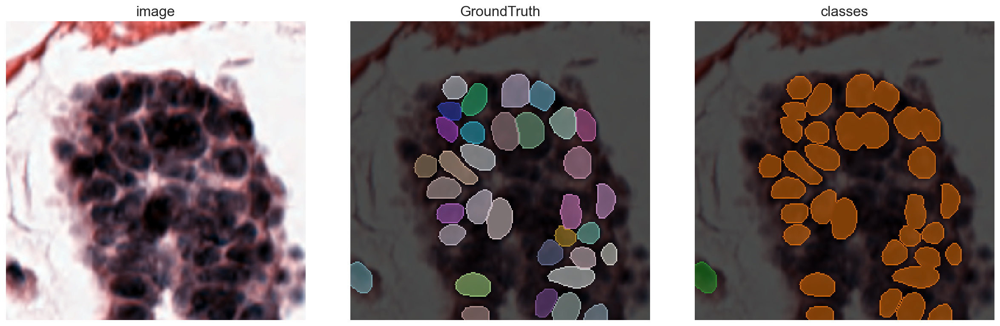

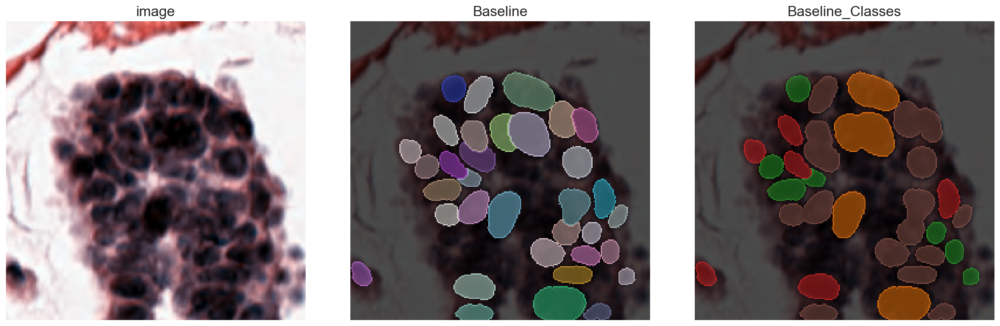

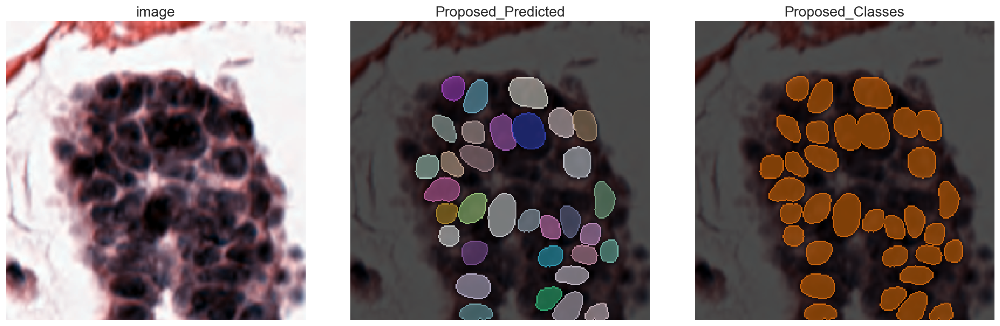

In [27]:
i3=2000
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3], lbl_title="GroundTruth")
plot_img_label(X_val[i3], Y_val_pred[i3], class_from_res(res_val_pred[i3]), lbl_title="Baseline", cls_title="Baseline_Classes");
plot_img_label(X_val[i3], Y_val_pred1[i3], class_from_res(res_val_pred1[i3]), lbl_title="Proposed_Predicted", cls_title="Proposed_Classes");

1/1 [==============================] - 0s 68ms/step


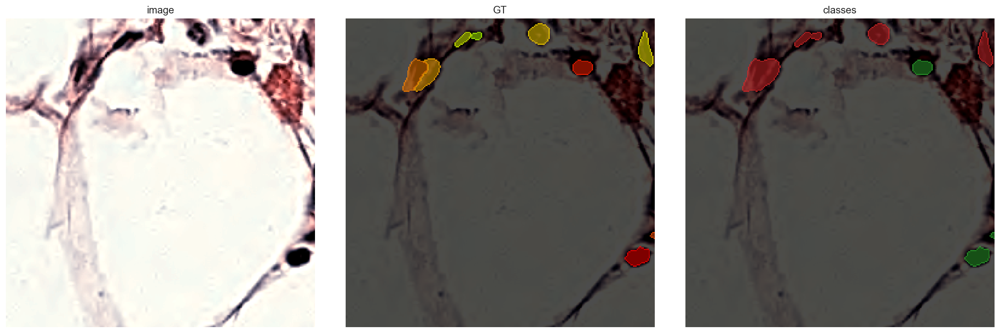

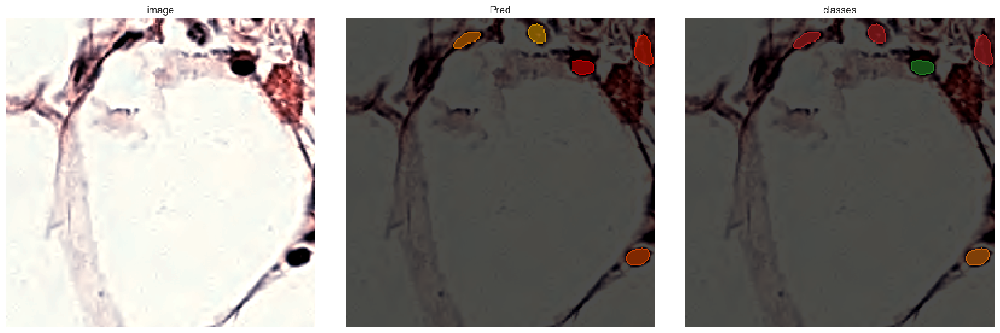

In [81]:
i3=1600
label, res = model.predict_instances(X_val[i3], n_tiles=model._guess_n_tiles(X_val[i3]))
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3],            lbl_title="GT")
plot_img_label(X_val[i3], label,    class_from_res(res), lbl_title="Pred");

1/1 [==============================] - 0s 70ms/step


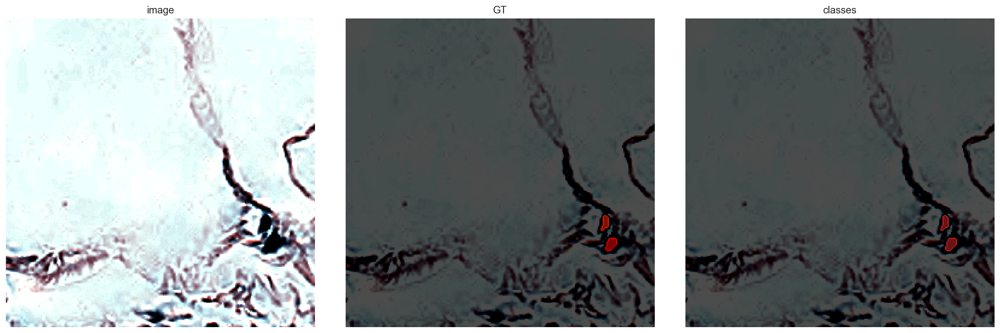

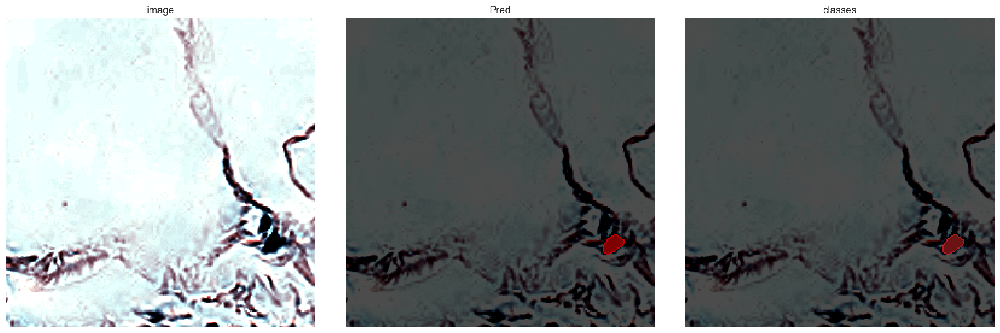

In [83]:
i3=1650
label, res = model.predict_instances(X_val[i3], n_tiles=model._guess_n_tiles(X_val[i3]))
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3],            lbl_title="GT")
plot_img_label(X_val[i3], label,    class_from_res(res), lbl_title="Pred");

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


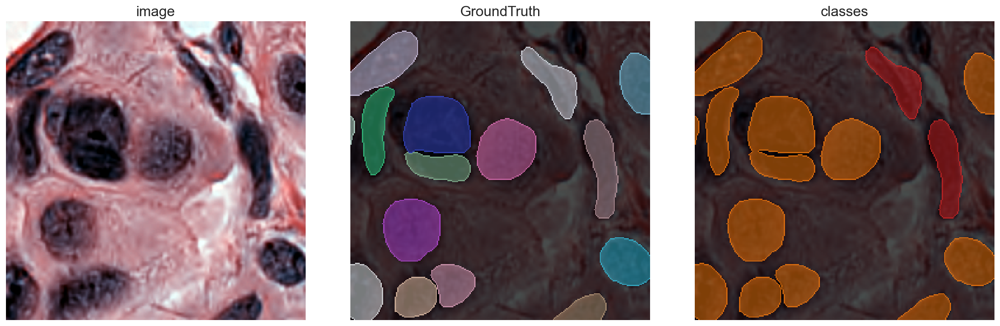

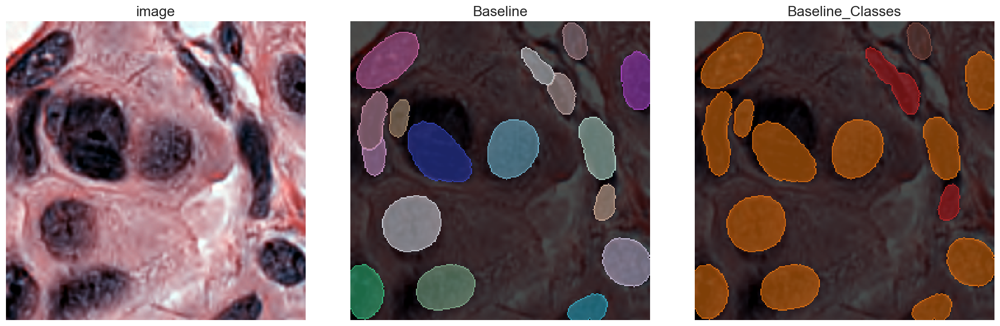

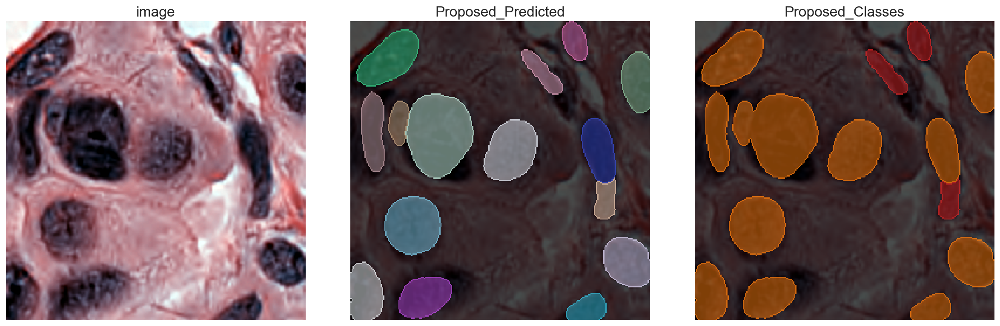

In [26]:
i3=1800
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3], lbl_title="GroundTruth")
plot_img_label(X_val[i3], Y_val_pred[i3], class_from_res(res_val_pred[i3]), lbl_title="Baseline", cls_title="Baseline_Classes");
plot_img_label(X_val[i3], Y_val_pred1[i3], class_from_res(res_val_pred1[i3]), lbl_title="Proposed_Predicted", cls_title="Proposed_Classes");

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


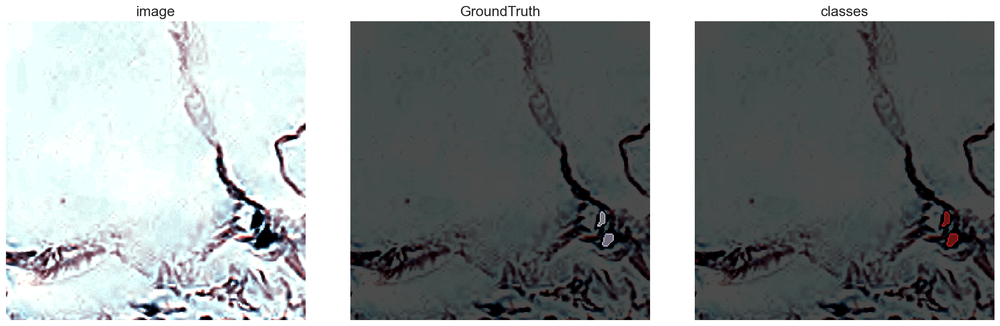

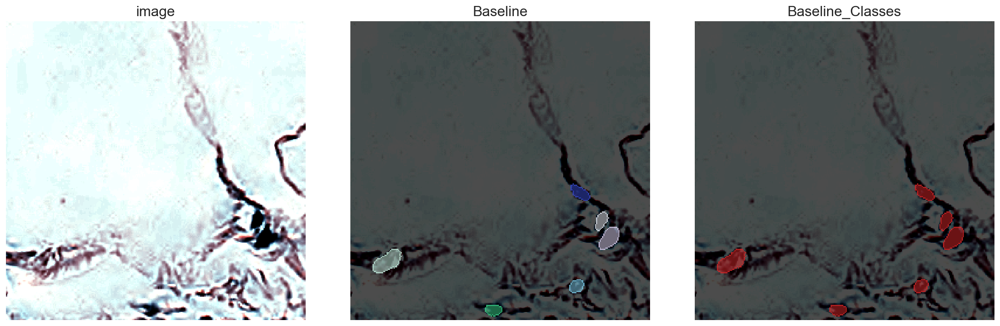

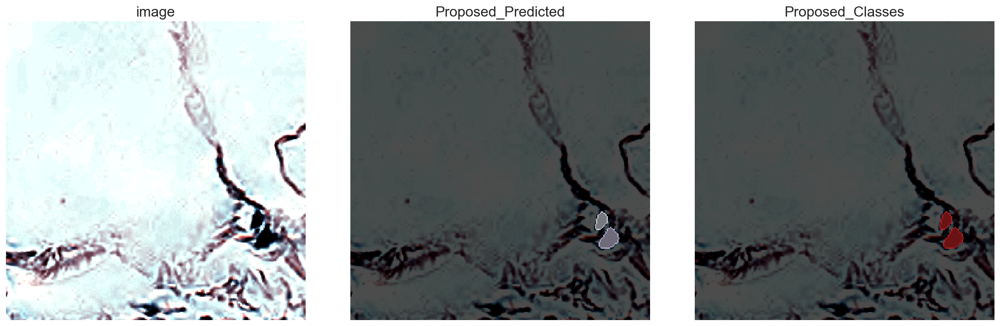

In [25]:
i3=1650
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3], lbl_title="GroundTruth")
plot_img_label(X_val[i3], Y_val_pred[i3], class_from_res(res_val_pred[i3]), lbl_title="Baseline", cls_title="Baseline_Classes");
plot_img_label(X_val[i3], Y_val_pred1[i3], class_from_res(res_val_pred1[i3]), lbl_title="Proposed_Predicted", cls_title="Proposed_Classes");

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


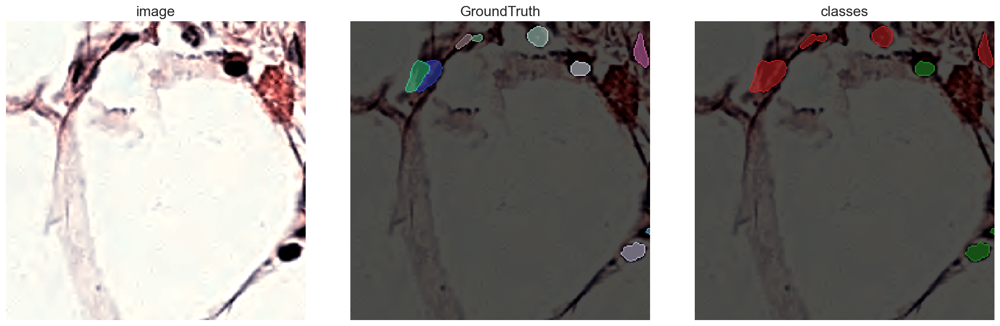

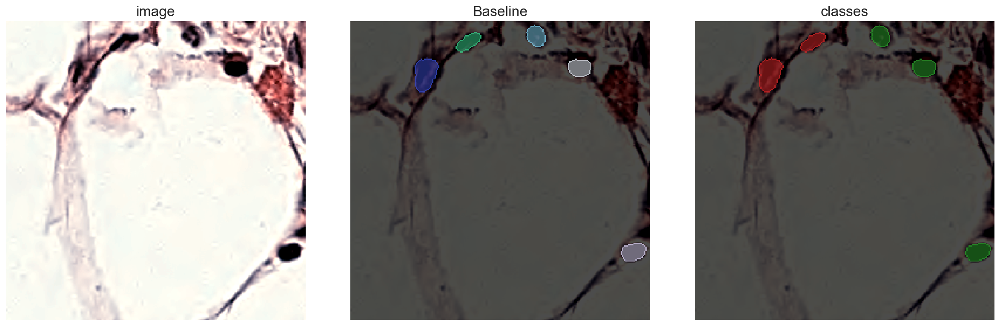

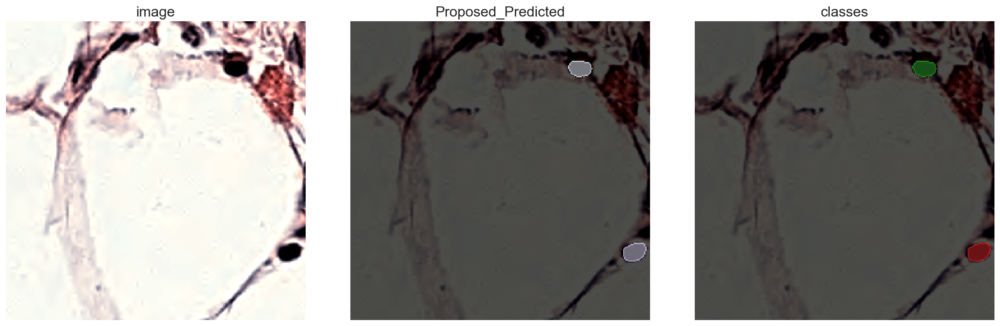

In [23]:
i3=1600
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3], lbl_title="GroundTruth")
plot_img_label(X_val[i3], Y_val_pred[i3], class_from_res(res_val_pred[i3]), lbl_title="Baseline");
plot_img_label(X_val[i3], Y_val_pred1[i3], class_from_res(res_val_pred1[i3]), lbl_title="Proposed_Predicted");

1/1 [==============================] - 0s 117ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


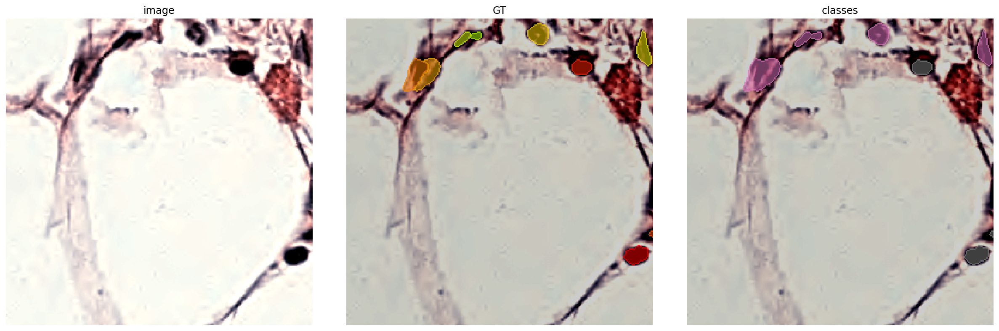

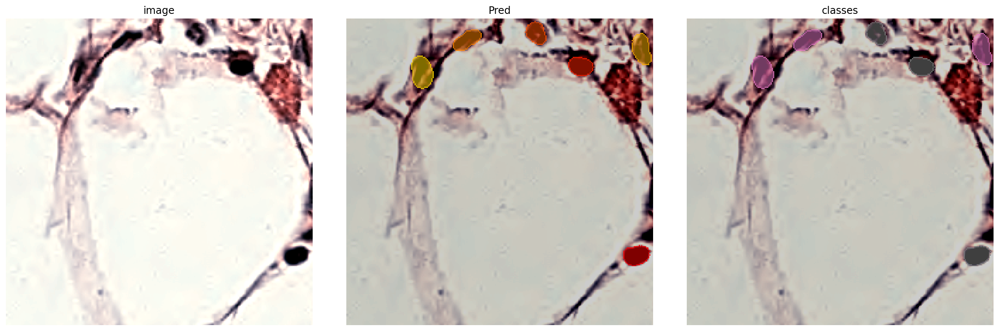

In [55]:
i3=1600
label, res = model.predict_instances(X_val[i3], n_tiles=model._guess_n_tiles(X_val[i3]))
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3],            lbl_title="GT")
plot_img_label(X_val[i3], label,    class_from_res(res), lbl_title="Pred");

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


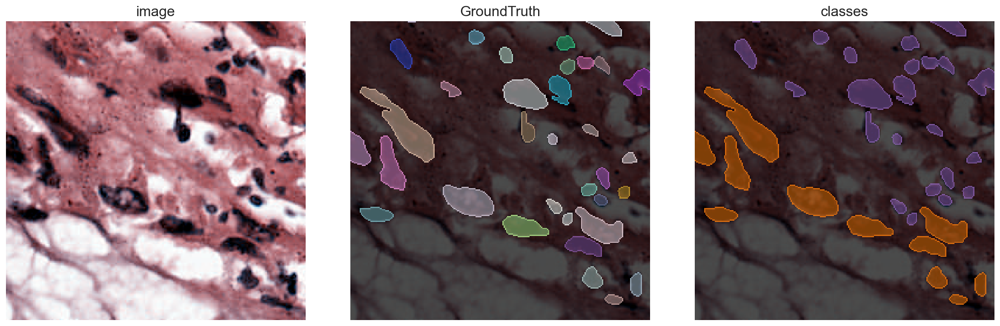

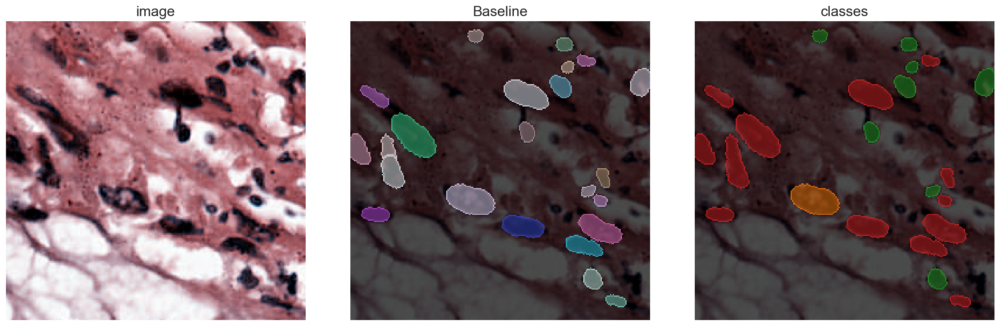

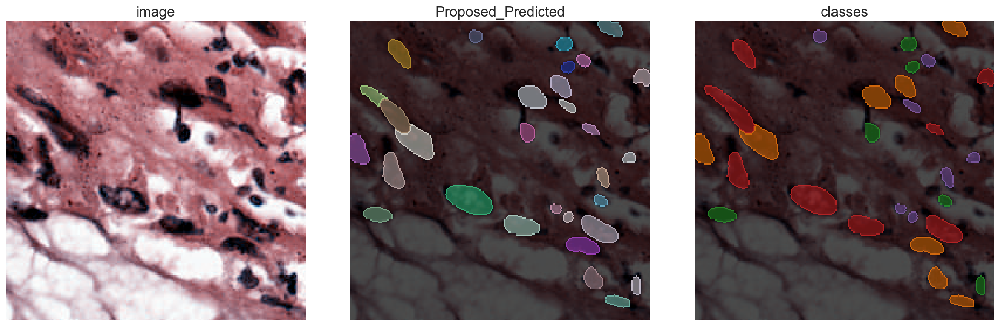

In [22]:
i3=900
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3], lbl_title="GroundTruth")
plot_img_label(X_val[i3], Y_val_pred[i3], class_from_res(res_val_pred[i3]), lbl_title="Baseline");
plot_img_label(X_val[i3], Y_val_pred1[i3], class_from_res(res_val_pred1[i3]), lbl_title="Proposed_Predicted");

1/1 [==============================] - 0s 107ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


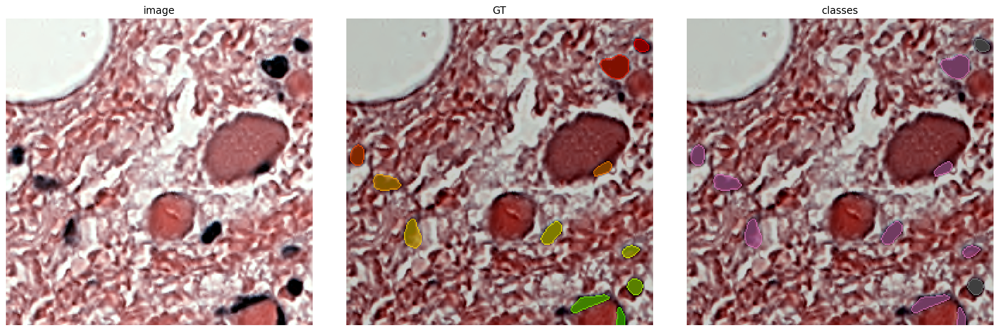

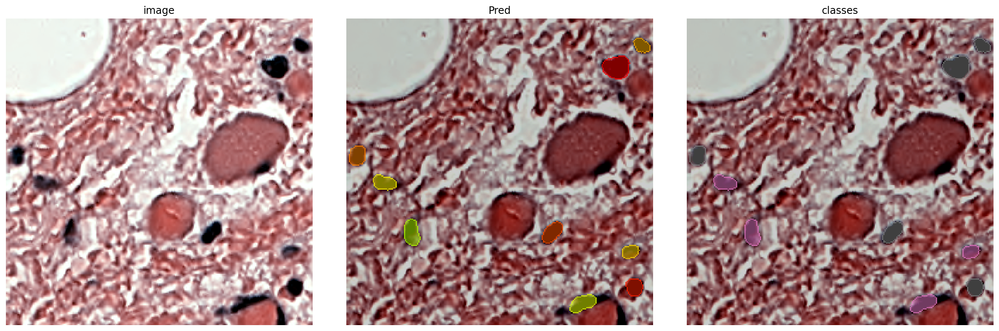

In [48]:
i3=900
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3], lbl_title="GroundTruth")
plot_img_label(X_val[i3], Y_val_pred[i3], class_from_res(res_val_pred[i3]), lbl_title="Baseline");
plot_img_label(X_val[i3], Y_val_pred1[i3], class_from_res(res_val_pred1[i3]), lbl_title="Proposed_Predicted");

1/1 [==============================] - 0s 94ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


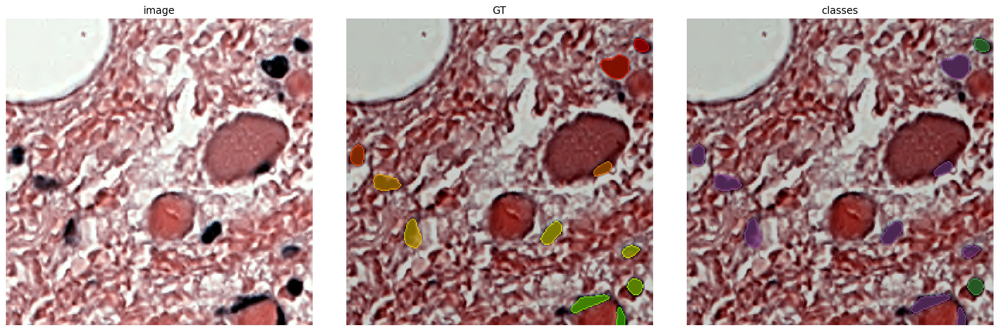

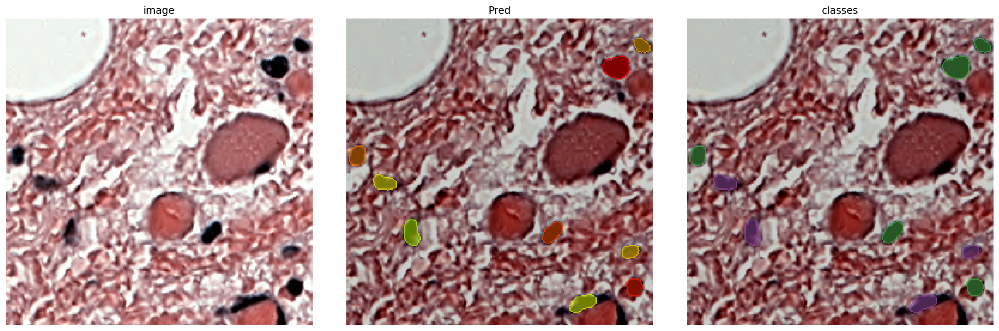

In [34]:
i3 = 1000
label, res = model.predict_instances(X_val[i3], n_tiles=model._guess_n_tiles(X_tst[i3]))
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3], lbl_title="GT")
plot_img_label(X_val[i3], label, class_from_res(res), lbl_title="Pred");

1/1 [==============================] - 0s 97ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


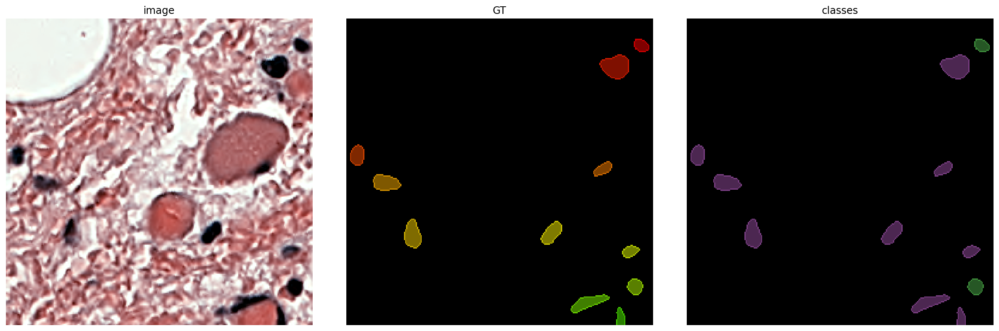

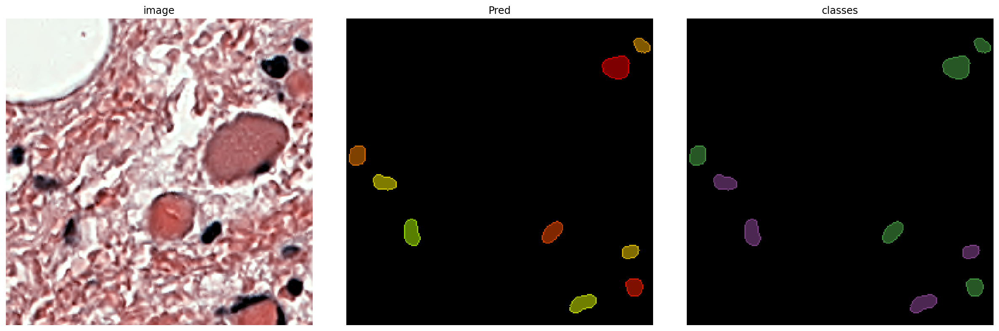

In [33]:
# plot_img_label(X_val[i3], label, class_from_res(res), lbl_title="Pred");
i3 = 1000
label, res = model.predict_instances(X_val[i3], n_tiles=model._guess_n_tiles(X_tst[i3]))
label, res = model.predict_instances(X_val[i3], n_tiles=model._guess_n_tiles(X_tst[i3]))
plot_img_label1(X_val[i3], Y_val[i3], cls_val[i3], lbl_title="GT")
plot_img_label1(X_val[i3], Y_val_pred[i3], class_from_res(res), lbl_title="Pred");

1/1 [==============================] - 0s 116ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


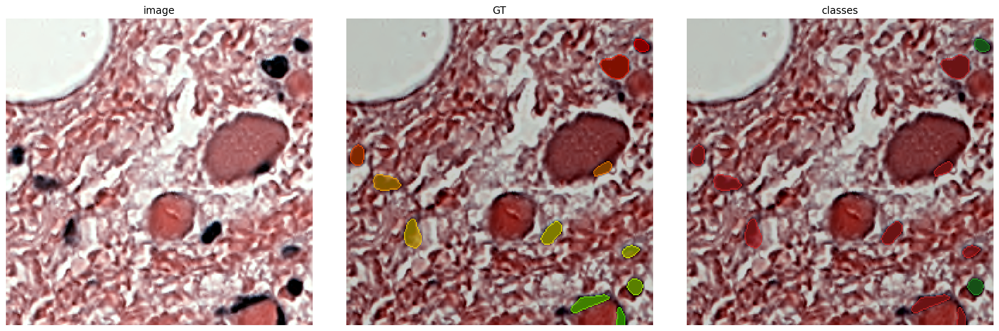

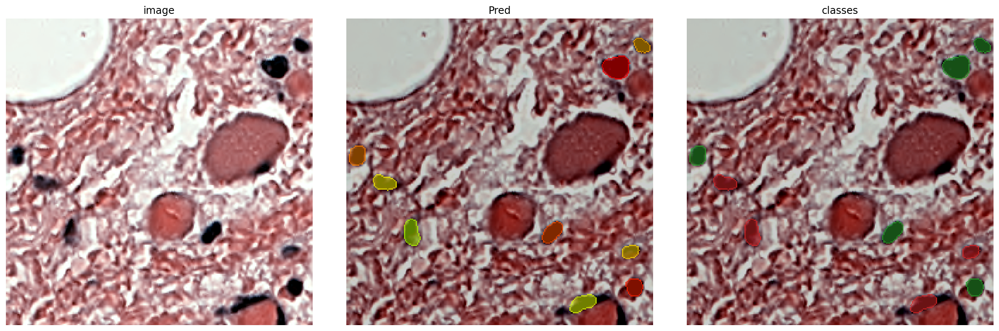

In [38]:
i3=1000
label, res = model.predict_instances(X_val[i3], n_tiles=model._guess_n_tiles(X_tst[i3]))
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3],            lbl_title="GT")
plot_img_label(X_val[i3], label,    class_from_res(res), lbl_title="Pred");

In [31]:
i1=2000
label, res = model.predict_instances(X_tst[i1], n_tiles=model._guess_n_tiles(X_tst[i1]))
plot_img_label(X_tst[i1], Y_tst[i1], cls_tst[i1],            lbl_title="GT")
plot_img_label(X_tst[i1], label,    class_from_res(res), lbl_title="Pred");

1/1 [==============================] - 0s 110ms/step


ValueError: all gt labels should be present in class dict provided 
gt_labels found
{1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13}
class dict labels provided
{0, 1}

In [ ]:
plot_img_label(X_val[i], Y_val[i], cls_val[i],            lbl_title="GT")
plot_img_label(X_val[i], label,    class_from_res(res), lbl_title="Pred");

Besides the losses and metrics during training, we can also quantitatively evaluate the actual detection/segmentation performance on the validation data by considering objects in the ground truth to be correctly matched if there are predicted objects with overlap (here [intersection over union (IoU)](https://en.wikipedia.org/wiki/Jaccard_index)) beyond a chosen IoU threshold $\tau$.

The corresponding matching statistics (average overlap, accuracy, recall, precision, etc.) are typically of greater practical relevance than the losses/metrics computed during training (but harder to formulate as a loss function). 
The value of $\tau$ can be between 0 (even slightly overlapping objects count as correctly predicted) and 1 (only pixel-perfectly overlapping objects count) and which $\tau$ to use depends on the needed segmentation precision/application.

Please see `help(matching)` for definitions of the abbreviations used in the evaluation below and see the Wikipedia page on [Sensitivity and specificity](https://en.wikipedia.org/wiki/Sensitivity_and_specificity) for further details.

First predict the labels for all validation images:

In [ ]:
Y_val_pred, res_val_pred = tuple(zip(*[model.predict_instances(x, n_tiles=model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(X_val[:])]))


In [ ]:
Y_val_pred1, res_val_pred1 = tuple(zip(*[model1.predict_instances(x, n_tiles=model1._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(X_val[:])]))

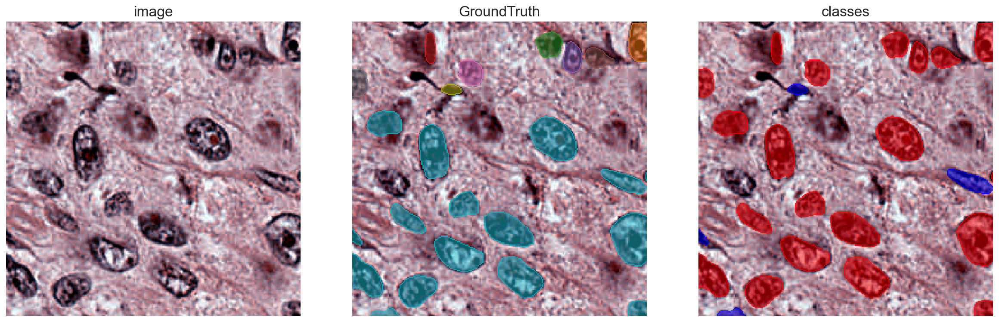

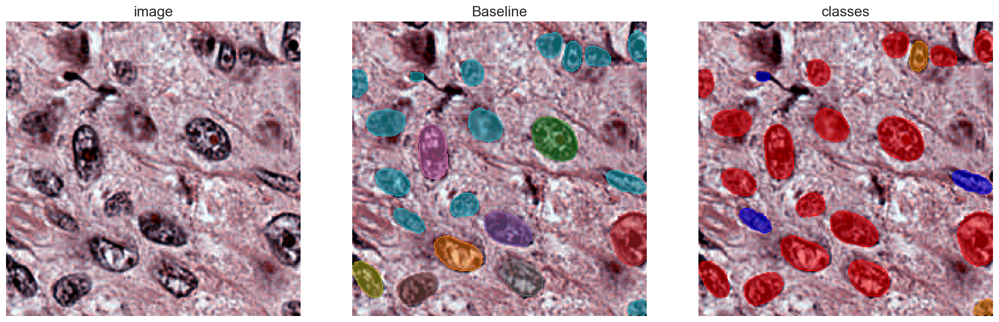

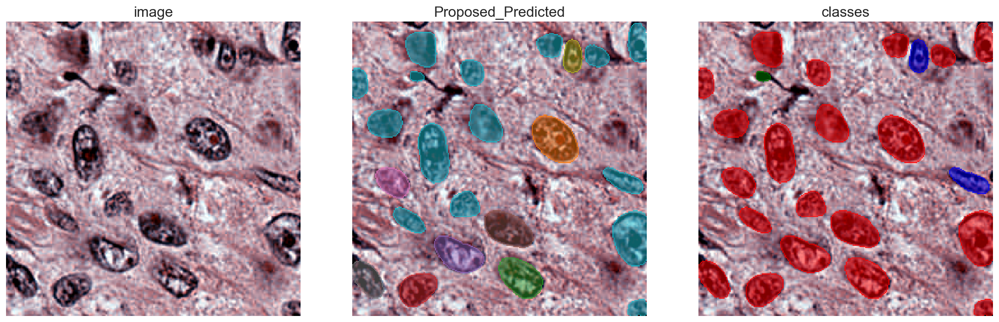

In [109]:

i3 =40
# label, res = model.predict_instances(X_val[i3], n_tiles=model._guess_n_tiles(X_tst[i3]))
# label, res = model.predict_instances(X_val[i3], n_tiles=model._guess_n_tiles(X_tst[i3]))
plot_img_label(X_val[i3], Y_val[i3], cls_val[i3], lbl_title="GroundTruth")
plot_img_label(X_val[i3], Y_val_pred[i3], class_from_res(res_val_pred[i3]), lbl_title="Baseline");
plot_img_label(X_val[i3], Y_val_pred1[i3], class_from_res(res_val_pred1[i3]), lbl_title="Proposed_Predicted");

In [ ]:
Y_tst_pred, res_tst_pred = tuple(zip(*[model.predict_instances(x, n_tiles=model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(X_tst[:])]))


In [ ]:
Y_tst_pred1, res_tst_pred1 = tuple(zip(*[model1.predict_instances(x, n_tiles=model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(X_tst[:])]))

In [17]:
# import tifffile
from tifffile import imwrite
def test_img_res( lbl, cls_dict, n_classes=6):
    c = mask_to_categorical(lbl, n_classes=n_classes, classes=cls_dict)
    res = np.zeros(lbl.shape, np.uint16)

    for i in range(1,c.shape[-1]):
        m = c[...,i]>0
        res[m] = i

    print(res.shape)
    print(res)
    print(np.unique(res))

    return res

In [18]:
cls_tmp_val=np.zeros_like(Y_val)

In [31]:
cls_dict_val=[cls[...,4]for cls in val_data]
# cls_val_tmp_dict = [[0 for x in range(66536)] for y in range(len(val_data))]
# cls_val_dict = [[0 for x in range(66536)] for y in range(len(val_data))]
# for i in range(len(val_data)):
#     cls_val_dict[i]=cls_dict_val[i].flatten()
#     cls_val_tmp_dict[i]=cls_tmp_val[i].flatten()
#
# # CL3 = [[0 for x in range(66536)] for y in range(len(val_data))]
# for i in range(len(val_data)):
#     CL3[i]=cls_dict[i].flatten()

In [34]:
for i in range(len(val_data)):
   # label, res = model.predict_instances(X_tst[i], n_tiles=model._guess_n_tiles(X_tst[i]))
   cls_tmp_val[i]=test_img_res( Y_val_pred[i],    class_from_res(res_val_pred[i]));
   # label=None
   # res=None
    # plot_img_label(X_val[i1], Y_val[i1], cls_val[i1],            lbl_title="GT")



(256, 256)
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[0 1 3]
(256, 256)
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[0 1 3 5]
(256, 256)
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[0 1 2 3 5]
(256, 256)
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[0 1 3]
(256, 256)
[[0 0 0 ... 0 0 0]
 [0 0 3 ... 0 0 0]
 [0 0 3 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[0 1 3]
(256, 256)
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[0 3]
(256, 256)
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[0 3]
(256, 256)
[[0 0 0 ... 0 

Plot another GT/prediction example

In [1]:

"""compute_stats.py. Calculates the statistical measurements for the CoNIC Challenge.
This code supports binary panoptic quality for binary segmentation, multiclass panoptic quality for
simultaneous segmentation and classification and multiclass coefficient of determination (R2) for
multiclass regression. Binary panoptic quality is calculated per image and the results are averaged.
For multiclass panoptic quality, stats are calculated over the entire dataset for each class before taking
the average over the classes.

"""

from docopt import docopt
import numpy as np
import os
import pandas as pd
from tqdm.auto import tqdm

from nurisc.stats_utils import get_pq, get_multi_pq_info, get_multi_r2


if __name__ == "__main__":


    # mode = args["--mode"]
    # pred_path = args["--pred"]
    # true_path = args["--true"]
    metrics= "multi_pq+"
    seg_metrics_names = [ "multi_pq+"]
    reg_metrics_names = ["r2"]

    # do initial checks
    # if mode not in ["regression", "seg_class"]:
    #     raise ValueError("`mode` must be either `regression` or `seg_class`")

    all_metrics = {}
    # mode == "seg_class"

        # check to make sure input is a single numpy array
    # pred_format = pred_path.split(".")[-1]
    # true_format = true_path.split(".")[-1]
    # if pred_format != "npy" or true_format != "npy":
    #         raise ValueError("pred and true must be in npy format.")

        # initialise empty placeholder lists
    pq_list = []
    mpq_info_list = []
        # load the prediction and ground truth arrays
    # pred_array = np.load(pred_path)
    # true_array = np.load(true_path)
    pred_array=cls_tmp_val[2]
    true_array=cls_dict_val[2]
    nr_patches = pred_array.shape[0]
    print(nr_patches)
    for patch_idx in tqdm(range(nr_patches)):
            # get a single patch
            pred = pred_array[patch_idx]
            true = true_array[patch_idx]

            # instance segmentation map
            # pred_inst = pred[..., 0]
            # true_inst = true[..., 0]
            # # classification map
            pred_class = pred[..., 0]
            true_class = true[..., 0]

            # ===============================================================

            for idx, metric in enumerate(seg_metrics_names):
                # if metric == "pq":
                #     # get binary panoptic quality
                #     pq = get_pq(true_inst, pred_inst)
                #     pq = pq[0][2]
                #     pq_list.append(pq)
                if metric == "multi_pq+":
                    # get the multiclass pq stats info from single image
                    mpq_info_single = get_multi_pq_info(true, pred)
                    print(mpq_info_single)
                    mpq_info = []
                    # aggregate the stat info per class
                    for single_class_pq in mpq_info_single:
                        tp = single_class_pq[0]
                        fp = single_class_pq[1]
                        fn = single_class_pq[2]
                        sum_iou = single_class_pq[3]
                        mpq_info.append([tp, fp, fn, sum_iou])
                    mpq_info_list.append(mpq_info)
                else:
                    raise ValueError("%s is not supported!" % metric)

    pq_metrics = np.array(pq_list)
    pq_metrics_avg = np.mean(pq_metrics, axis=-1)  # average over all images
    if "multi_pq+" in seg_metrics_names:
        mpq_info_metrics = np.array(mpq_info_list, dtype="float")
            # sum over all the images
        total_mpq_info_metrics = np.sum(mpq_info_metrics, axis=0)

        for idx, metric in enumerate(seg_metrics_names):
            if metric == "multi_pq+":
                mpq_list = []
                # for each class, get the multiclass PQ
                for cat_idx in range(total_mpq_info_metrics.shape[0]):
                    total_tp = total_mpq_info_metrics[cat_idx][0]
                    total_fp = total_mpq_info_metrics[cat_idx][1]
                    total_fn = total_mpq_info_metrics[cat_idx][2]
                    total_sum_iou = total_mpq_info_metrics[cat_idx][3]

                    # get the F1-score i.e DQ
                    dq = total_tp / (
                        (total_tp + 0.5 * total_fp + 0.5 * total_fn) + 1.0e-6
                    )
                    # get the SQ, when not paired, it has 0 IoU so does not impact
                    sq = total_sum_iou / (total_tp + 1.0e-6)
                    mpq_list.append(dq * sq)
                mpq_metrics = np.array(mpq_list)
                all_metrics[metric] = [np.mean(mpq_metrics)]
            else:
                all_metrics[metric] = [pq_metrics_avg]

    # else:
    #     # first check to make sure ground truth and prediction is in csv format
    #     if not os.path.isfile(true_path) or not os.path.isfile(pred_path):
    #         raise ValueError("pred and true must be in csv format.")
    #
    #     pred_format = pred_path.split(".")[-1]
    #     true_format = true_path.split(".")[-1]
    #     if pred_format != "csv" or true_format != "csv":
    #         raise ValueError("pred and true must be in csv format.")
    #
    #     pred_csv = pd.read_csv(pred_path)
    #     true_csv = pd.read_csv(true_path)
    #
    #     for idx, metric in enumerate(reg_metrics_names):
    #         if metric == "r2":
    #             # calculate multiclass coefficient of determination
    #             r2 = get_multi_r2(true_csv, pred_csv)
    #             all_metrics["multi_r2"] = [r2]
    #         else:
    #             raise ValueError("%s is not supported!" % metric)

    df = pd.DataFrame(all_metrics)
    df = df.to_string(index=False)
    print(df)

NameError: name 'cls_tmp_val' is not defined

In [363]:
print(cls_val_dict[1])

[0 0 0 ... 0 0 0]


In [26]:
taus = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
stats = [matching_dataset(Y_val, Y_val_pred, thresh=t, show_progress=False) for t in tqdm(taus)]


100%|██████████| 9/9 [01:21<00:00,  9.09s/it]


In [27]:
stats[taus.index(0.5)]

DatasetMatching(criterion='iou', thresh=0.5, fp=8000, tp=40293, fn=19433, precision=0.8343445219804112, recall=0.6746308140508321, accuracy=0.594941381448779, f1=0.7460354196946833, n_true=59726, n_pred=48293, mean_true_score=0.536967833179545, mean_matched_score=0.7959432359090042, panoptic_quality=0.5938018460545184, segmentation_quality=0.7959432359090042, detection_quality=0.7460354196946833, by_image=False)

In [28]:
taus1 = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
stats1 = [matching_dataset(Y_val, Y_val_pred1, thresh=t, show_progress=False) for t in tqdm(taus1)]


100%|██████████| 9/9 [01:15<00:00,  8.39s/it]


In [29]:
stats1[taus1.index(0.5)]

DatasetMatching(criterion='iou', thresh=0.5, fp=6892, tp=42166, fn=17560, precision=0.8595132292388601, recall=0.7059906908214179, accuracy=0.6329520550001501, f1=0.7752242976908369, n_true=59726, n_pred=49058, mean_true_score=0.5720669847580919, mean_matched_score=0.8103038640530711, panoptic_quality=0.6281672439267134, segmentation_quality=0.8103038640530711, detection_quality=0.7752242976908369, by_image=False)

Plot the matching statistics and the number of true/false positives/negatives as a function of the IoU threshold $\tau$.

In [24]:
taus = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
stats1 = [matching_dataset(Y_tst, Y_tst_pred1, thresh=t, show_progress=False) for t in tqdm(taus)]

100%|██████████| 9/9 [01:22<00:00,  9.22s/it]


In [25]:
stats1[taus.index(0.5)]

DatasetMatching(criterion='iou', thresh=0.5, fp=7297, tp=46813, fn=19638, precision=0.8651450748475328, recall=0.7044739733036373, accuracy=0.634769756467972, f1=0.7765861265251616, n_true=66451, n_pred=54110, mean_true_score=0.5716792839995801, mean_matched_score=0.8114980902966291, panoptic_quality=0.630198158626025, segmentation_quality=0.8114980902966291, detection_quality=0.7765861265251616, by_image=False)

In [ ]:
taus1 = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
stats2 = [matching_dataset( cls_tmp_val,Y_val_pred, thresh=t, show_progress=False) for t in tqdm(taus)]

In [36]:
stats2[taus1.index(0.5)]

DatasetMatching(criterion='iou', thresh=0.5, fp=50531, tp=1929, fn=4226, precision=0.03677087304613039, recall=0.31340373679935013, accuracy=0.034029566383233956, f1=0.0658193295231596, n_true=6155, n_pred=52460, mean_true_score=0.26129326045658413, mean_matched_score=0.8337273292432739, panoptic_quality=0.05487537381592682, by_image=False)

In [346]:
stats1[taus1.index(0.5)]

DatasetMatching(criterion='iou', thresh=0.5, fp=10792, tp=38172, fn=21554, precision=0.7795931704926068, recall=0.6391186417975421, accuracy=0.5413086020590487, f1=0.7024013248688932, n_true=59726, n_pred=48964, mean_true_score=0.49620599301989543, mean_matched_score=0.7763910494369243, panoptic_quality=0.545338101740846, by_image=False)

534452162.py (5): marker is redundantly defined by the 'marker' keyword argument and the fmt string ".-" (-> marker='.'). The keyword argument will take precedence.
534452162.py (20): marker is redundantly defined by the 'marker' keyword argument and the fmt string ".-" (-> marker='.'). The keyword argument will take precedence.


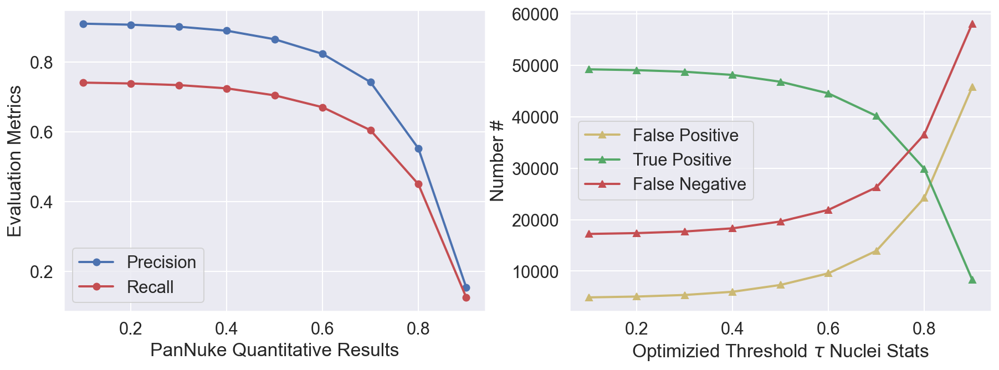

In [27]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(15,5))
colors = "brcymkw"
i= 0
for m in ('precision', 'recall'):
    ax1.plot(taus, [s._asdict()[m] for s in stats1], '.-', lw=2, label=m,c=colors[i],marker='o')
    i=i+1
ax1.set_xlabel(r'PanNuke Quantitative Results')
ax1.set_ylabel('Evaluation Metrics')
# t="CPM-17 Quantitative Results"
# ax1.title(t)
# ax1.grid()
ax1.legend()
L=ax1.legend()
L.get_texts()[0].set_text('Precision')
L.get_texts()[1].set_text('Recall')

colors1 = "ygrmgrcy"
j=0
for m in ('fp', 'tp', 'fn'):
    ax2.plot(taus, [s._asdict()[m] for s in stats1], '.-', lw=2, label=m,c=colors1[j],marker='^')
    j=j+1
ax2.set_xlabel(r'Optimizied Threshold $\tau$ Nuclei Stats')
ax2.set_ylabel('Number #')
# ax2.grid()
ax2.legend();
L1=ax2.legend()
L1.get_texts()[0].set_text('False Positive')
L1.get_texts()[1].set_text('True Positive')
L1.get_texts()[2].set_text('False Negative')

In [39]:
taus1 = [ 0.3,0.4, 0.5, 0.6, 0.7, 0.8]
stats1 = [matching_dataset(Y_val, Y_val_pred1, thresh=t, show_progress=False) for t in tqdm(taus1)]


100%|██████████| 6/6 [00:41<00:00,  6.88s/it]


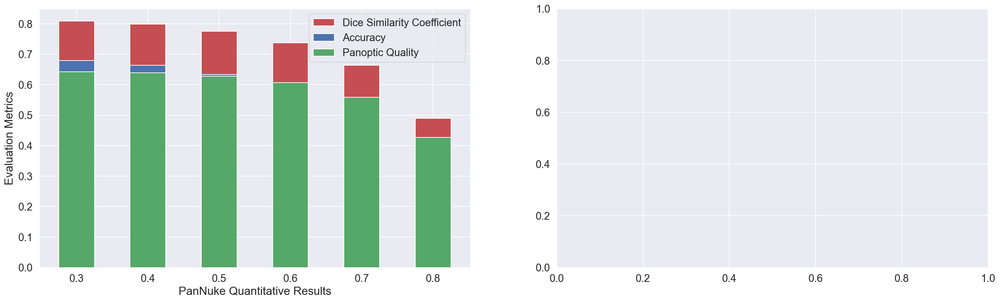

In [40]:

fig, (ax1,ax2) = plt.subplots(1,2, figsize=(25,7))
colors = "bgr"
i= -1
j=0
for m in (  'f1','accuracy','panoptic_quality'):
    ax1.bar(taus1, [s._asdict()[m] for s in stats1], width=0.05, label=m, color=colors[i])
    i=i+1

ax1.set_xlabel(r'PanNuke Quantitative Results')
ax1.set_ylabel('Evaluation Metrics')
# t="CPM-17 Quantitative Results"
# ax1.title(t)
# ax1.grid()
ax1.legend()
L=ax1.legend()
L.get_texts()[0].set_text('Dice Similarity Coefficient')
L.get_texts()[1].set_text('Accuracy')
L.get_texts()[2].set_text('Panoptic Quality')

1053156390.py (6): marker is redundantly defined by the 'marker' keyword argument and the fmt string ".-" (-> marker='.'). The keyword argument will take precedence.


ValueError: x and y must have same first dimension, but have shapes (9,) and (6,)

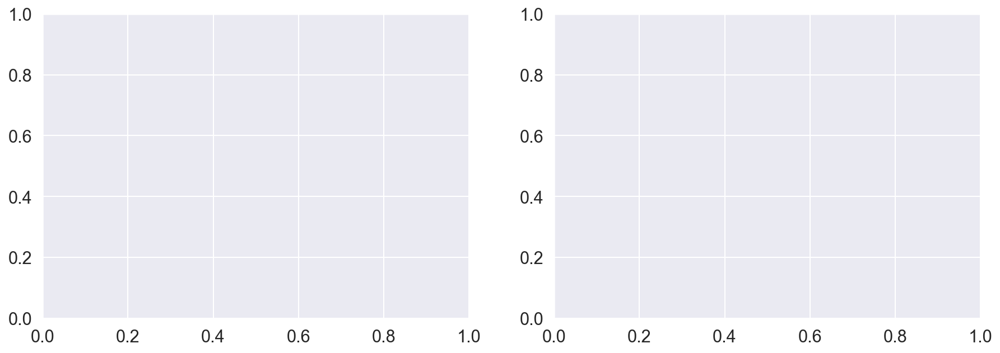

In [41]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(15,5))
colors = "bgrcymkw"
markers='o^+v*'
i= 0
for m in ('precision', 'recall', 'accuracy', 'f1', 'panoptic_quality'):
    ax1.plot(taus, [s._asdict()[m] for s in stats1], '.-', lw=2, label=m,c=colors[i],marker=markers[i])
    i=i+1
ax1.set_xlabel(r'PanNuke Quantitative Results', fontsize=14)
ax1.set_ylabel('Evaluation Metrics', fontsize=14)
# t="CPM-17 Quantitative Results"
# ax1.title(t)
# ax1.grid()
ax1.legend()
L=ax1.legend( fontsize=14)
L.get_texts()[0].set_text('Precision')
L.get_texts()[1].set_text('Recall')
L.get_texts()[2].set_text('Accuracy')
L.get_texts()[3].set_text('Dice Similarity Coefficient')
L.get_texts()[4].set_text('Panoptic Quality')
for m in ('fp', 'tp', 'fn'):
    ax2.plot(taus, [s._asdict()[m] for s in stats1], '.-', lw=2, label=m)
ax2.set_xlabel(r'IoU threshold $\tau$')
ax2.set_ylabel('Number #', fontsize=14)
ax2.grid()
ax2.legend();

In [60]:
import numpy as np
from scipy.optimize import linear_sum_assignment

####
def get_fast_pq(true, pred, match_iou=0.5):
    """
    `match_iou` is the IoU threshold level to determine the pairing between
    GT instances `p` and prediction instances `g`. `p` and `g` is a pair
    if IoU > `match_iou`. However, pair of `p` and `g` must be unique
    (1 prediction instance to 1 GT instance mapping).
    If `match_iou` < 0.5, Munkres assignment (solving minimum weight matching
    in bipartite graphs) is caculated to find the maximal amount of unique pairing.
    If `match_iou` >= 0.5, all IoU(p,g) > 0.5 pairing is proven to be unique and
    the number of pairs is also maximal.

    Fast computation requires instance IDs are in contiguous orderding
    i.e [1, 2, 3, 4] not [2, 3, 6, 10]. Please call `remap_label` beforehand
    and `by_size` flag has no effect on the result.
    Returns:
        [dq, sq, pq]: measurement statistic
        [paired_true, paired_pred, unpaired_true, unpaired_pred]:
                      pairing information to perform measurement

    """
    assert match_iou >= 0.0, "Cant' be negative"

    true = np.copy(true)
    pred = np.copy(pred)
    true_id_list = list(np.unique(true))
    pred_id_list = list(np.unique(pred))

    true_masks = [None,]
    for t in true_id_list[1:]:
        t_mask = np.array(true == t, np.uint8)
        true_masks.append(t_mask)

    pred_masks = [None,]
    for p in pred_id_list[1:]:
        p_mask = np.array(pred == p, np.uint8)
        pred_masks.append(p_mask)

    # prefill with value
    pairwise_iou = np.zeros([len(true_id_list) -1,
                             len(pred_id_list) -1], dtype=np.float64)

    # caching pairwise iou
    for true_id in true_id_list[1:]: # 0-th is background
        t_mask = true_masks[true_id]
        pred_true_overlap = pred[t_mask > 0]
        pred_true_overlap_id = np.unique(pred_true_overlap)
        pred_true_overlap_id = list(pred_true_overlap_id)
        for pred_id in pred_true_overlap_id:
            if pred_id == 0: # ignore
                continue # overlaping background
            p_mask = pred_masks[pred_id]
            total = (t_mask + p_mask).sum()
            inter = (t_mask * p_mask).sum()
            iou = inter / (total - inter)
            pairwise_iou[true_id-1, pred_id-1] = iou
    #
    if match_iou >= 0.5:
        paired_iou = pairwise_iou[pairwise_iou > match_iou]
        pairwise_iou[pairwise_iou <= match_iou] = 0.0
        paired_true, paired_pred = np.nonzero(pairwise_iou)
        paired_iou = pairwise_iou[paired_true, paired_pred]
        paired_true += 1 # index is instance id - 1
        paired_pred += 1 # hence return back to original
    else:  # * Exhaustive maximal unique pairing
        #### Munkres pairing with scipy library
        # the algorithm return (row indices, matched column indices)
        # if there is multiple same cost in a row, index of first occurence
        # is return, thus the unique pairing is ensure
        # inverse pair to get high IoU as minimum
        paired_true, paired_pred = linear_sum_assignment(-pairwise_iou)
        ### extract the paired cost and remove invalid pair
        paired_iou = pairwise_iou[paired_true, paired_pred]

        # now select those above threshold level
        # paired with iou = 0.0 i.e no intersection => FP or FN
        paired_true = list(paired_true[paired_iou > match_iou] + 1)
        paired_pred = list(paired_pred[paired_iou > match_iou] + 1)
        paired_iou = paired_iou[paired_iou > match_iou]

    # get the actual FP and FN
    unpaired_true = [idx for idx in true_id_list[1:] if idx not in paired_true]
    unpaired_pred = [idx for idx in pred_id_list[1:] if idx not in paired_pred]
    # print(paired_iou.shape, paired_true.shape, len(unpaired_true), len(unpaired_pred))

    #
    tp = len(paired_true)
    fp = len(unpaired_pred)
    fn = len(unpaired_true)
    # get the F1-score i.e DQ
    dq = tp / (tp + 0.5 * fp + 0.5 * fn)
    # get the SQ, no paired has 0 iou so not impact
    sq = paired_iou.sum() / (tp + 1.0e-6)

    return [dq, sq, dq * sq], [paired_true, paired_pred, unpaired_true, unpaired_pred]
#####

def remap_label(pred, by_size=False):
    """
    Rename all instance id so that the id is contiguous i.e [0, 1, 2, 3]
    not [0, 2, 4, 6]. The ordering of instances (which one comes first)
    is preserved unless by_size=True, then the instances will be reordered
    so that bigger nucler has smaller ID
    Args:
        pred    : the 2d array contain instances where each instances is marked
                  by non-zero integer
        by_size : renaming with larger nuclei has smaller id (on-top)
    """
    pred_id = list(np.unique(pred))
    pred_id.remove(0)
    if len(pred_id) == 0:
        return pred # no label
    if by_size:
        pred_size = []
        for inst_id in pred_id:
            size = (pred == inst_id).sum()
            pred_size.append(size)
        # sort the id by size in descending order
        pair_list = zip(pred_id, pred_size)
        pair_list = sorted(pair_list, key=lambda x: x[1], reverse=True)
        pred_id, pred_size = zip(*pair_list)

    new_pred = np.zeros(pred.shape, np.int32)
    for idx, inst_id in enumerate(pred_id):
        new_pred[pred == inst_id] = idx + 1
    return new_pred
####


def binarize(x):
    '''
    convert multichannel (multiclass) instance segmetation tensor
    to binary instance segmentation (bg and nuclei),
    :param x: B*B*C (for PanNuke 256*256*5 )
    :return: Instance segmentation
    '''
    out = np.zeros([x.shape[0], x.shape[1]])
    count = 1
    for i in range(x.shape[2]):
        x_ch = x[:,:,i]
        unique_vals = np.unique(x_ch)
        unique_vals = unique_vals.tolist()
        unique_vals.remove(0)
        for j in unique_vals:
            x_tmp = x_ch == j
            x_tmp_c = 1- x_tmp
            out *= x_tmp_c
            out += count*x_tmp
            count += 1
    out = out.astype('int32')

    unq = np.unique(out)
    new = out
    for i in range(len(np.unique(out))):
          new = np.where(out == unq[i], i, new)

    return new.astype('int32')#out

####

def get_tissue_idx(tissue_indices, idx):
    for i in range(len(tissue_indices)):
        if tissue_indices[i].count(idx) == 1:
            tiss_idx = i
    return tiss_idx

3074128236.py (6): marker is redundantly defined by the 'marker' keyword argument and the fmt string ".-" (-> marker='.'). The keyword argument will take precedence.
3074128236.py (23): marker is redundantly defined by the 'marker' keyword argument and the fmt string ".-" (-> marker='.'). The keyword argument will take precedence.


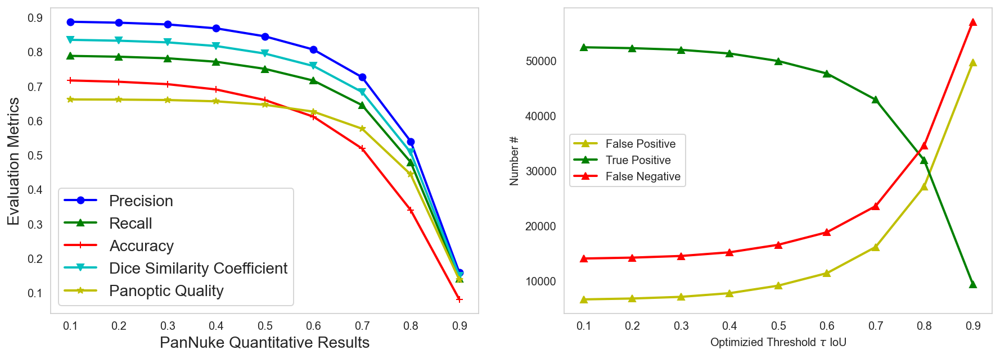

In [98]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(15,5))
colors = "bgrcymkw"
markers='o^+v*'
i= 0
for m in ('precision', 'recall', 'accuracy', 'f1', 'panoptic_quality'):
    ax1.plot(taus, [s._asdict()[m] for s in stats1], '.-', lw=2, label=m,c=colors[i],marker=markers[i])
    i=i+1
ax1.set_xlabel(r'PanNuke Quantitative Results', fontsize=14)
ax1.set_ylabel('Evaluation Metrics', fontsize=14)
# t="CPM-17 Quantitative Results"
# ax1.title(t)
ax1.grid()
ax1.legend()
L=ax1.legend( fontsize=14)
L.get_texts()[0].set_text('Precision')
L.get_texts()[1].set_text('Recall')
L.get_texts()[2].set_text('Accuracy')
L.get_texts()[3].set_text('Dice Similarity Coefficient')
L.get_texts()[4].set_text('Panoptic Quality')
colors1 = "ygrmgrcy"
j=0
for m in ('fp', 'tp', 'fn'):
    ax2.plot(taus, [s._asdict()[m] for s in stats1], '.-', lw=2, label=m,c=colors1[j],marker='^')
    j=j+1
ax2.set_xlabel(r'Optimizied Threshold $\tau$ IoU')
ax2.set_ylabel('Number #')
ax2.grid()
ax2.legend();
L1=ax2.legend()
L1.get_texts()[0].set_text('False Positive')
L1.get_texts()[1].set_text('True Positive')
L1.get_texts()[2].set_text('False Negative')

In [28]:
def test_img_res( lbl, cls_dict, n_classes=5):
    c = mask_to_categorical(lbl, n_classes=n_classes, classes=cls_dict)
    res = np.zeros(lbl.shape, np.uint16)

    for i in range(1,c.shape[-1]):
        m = c[...,i]>0
        res[m] = i

    # print(res.shape)
    # print(res)
    # print(np.unique(res))

    return res

In [32]:
import nltk
from nltk import flatten
cls_tst_tmp_dict = [[0 for x in range(66536)] for y in range(len(cls_tst))]
cls_tst_dict = [[0 for x in range(66536)] for y in range(len(cls_tst))]
cls_tmp_tst=np.zeros_like(Y_tst)
for i in range(len(cls_tst)):

   cls_tmp_tst[i]=test_img_res( Y_tst_pred1[i],    class_from_res(res_tst_pred1[i]));
cls_tst_new=[cls[...,4]for cls in tst_data]
# cls_val_new = [cls[i] for i in ind_tst]
for i in range(len(cls_tst)):
    cls_tst_dict[i]=cls_tst_new[i].flatten()
    cls_tst_tmp_dict[i]=cls_tmp_tst[i].flatten()
tr=list(cls_tst_tmp_dict)
tr1=flatten(tr)
z=np.concatenate( tr1, axis=0 )
tr2=list(cls_tst_dict)
tr3=flatten(tr2)
w=np.concatenate( tr3, axis=0 )
# z[z == 5] = 4
# w[w == 5] = 4

In [33]:
import nltk
from nltk import flatten
cls_val_tmp_dict = [[0 for x in range(66536)] for y in range(len(cls_val))]
cls_val_dict = [[0 for x in range(66536)] for y in range(len(cls_val))]
cls_tmp_val=np.zeros_like(Y_val)
for i in range(len(cls_val)):

   cls_tmp_val[i]=test_img_res( Y_val_pred[i],    class_from_res(res_val_pred[i]));
cls_tst_new=[cls[...,4]for cls in val_data]
# cls_val_new = [cls[i] for i in ind_tst]
for i in range(len(cls_val)):
    cls_val_dict[i]=cls_tst_new[i].flatten()
    cls_val_tmp_dict[i]=cls_tmp_val[i].flatten()
tr=list(cls_val_tmp_dict)
tr1=flatten(tr)
z=np.concatenate( tr1, axis=0 )
tr2=list(cls_val_dict)
tr3=flatten(tr2)
w=np.concatenate( tr3, axis=0 )
# z[z == 5] = 4
# w[w == 5] = 4

NameError: name 'Y_val_pred' is not defined

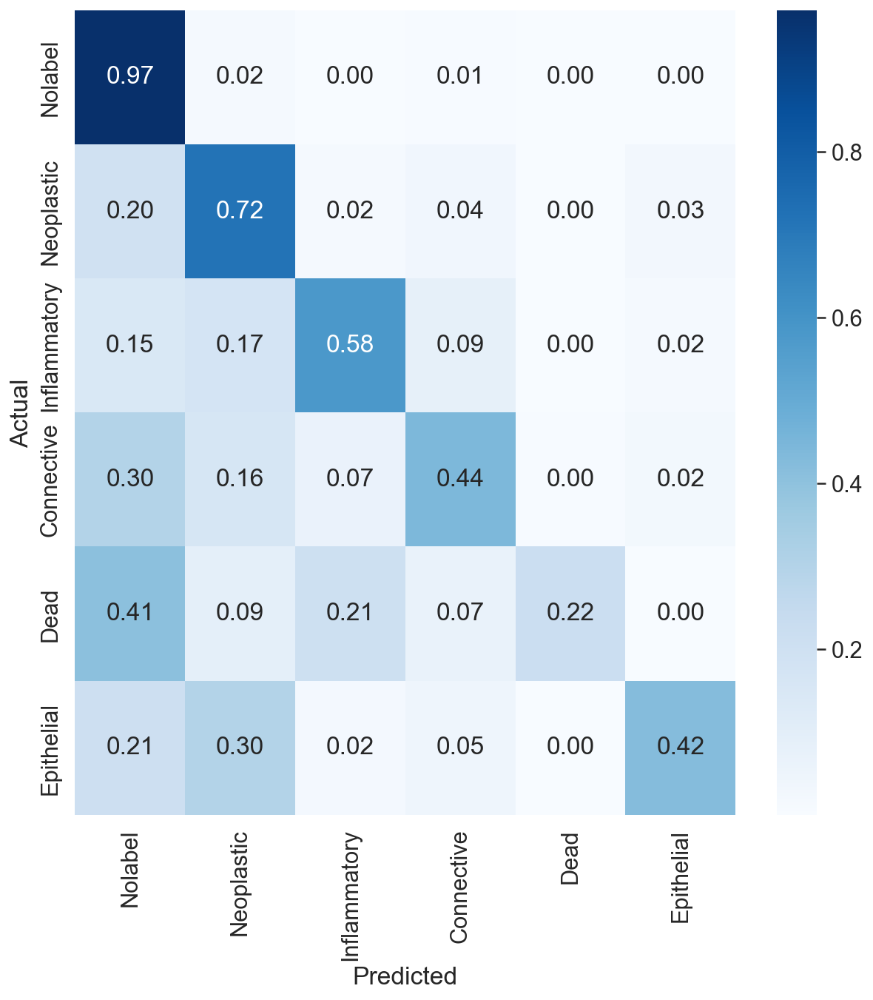

In [96]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
target_names=['Nolabel','Neoplastic', 'Inflammatory', 'Connective','Dead','Epithelial']
cm = confusion_matrix(w, z)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=target_names, yticklabels=target_names, cmap=matplotlib.cm.Blues)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

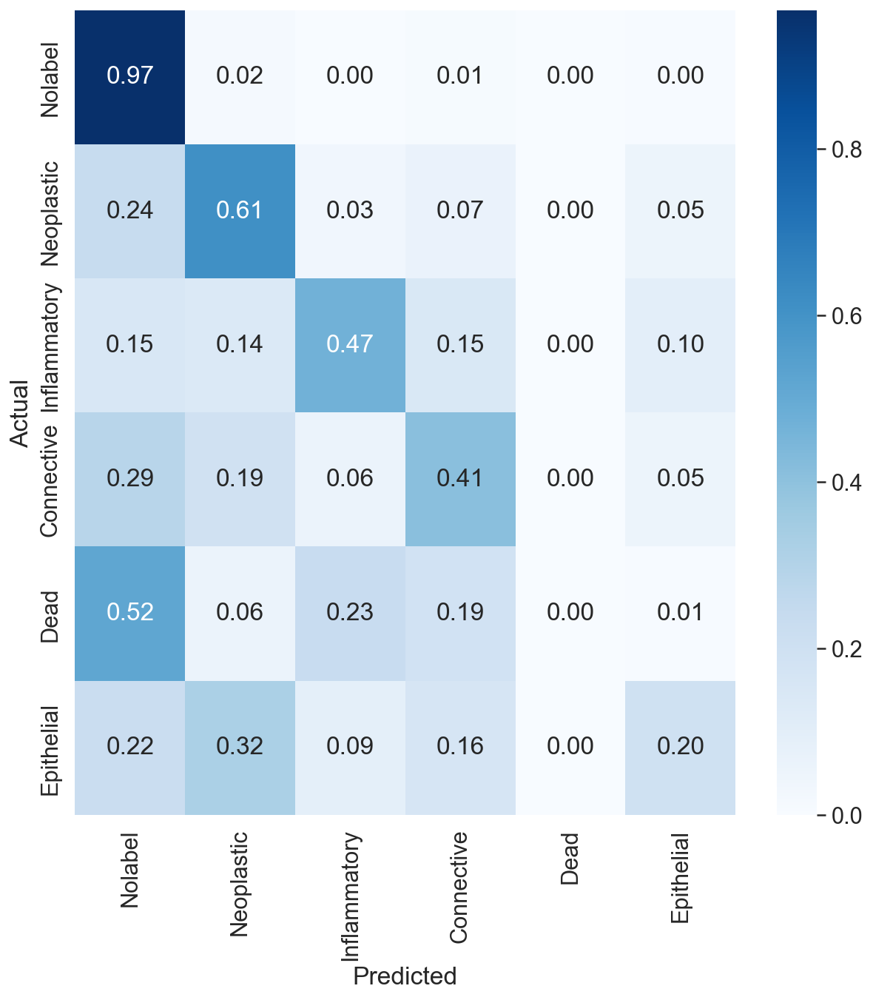

In [36]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
target_names=['Nolabel','Neoplastic', 'Inflammatory', 'Connective','Dead','Epithelial']
cm = confusion_matrix(w, z)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=target_names, yticklabels=target_names, cmap=matplotlib.cm.Blues)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

from sklearn.metrics import confusion_matrix
import seaborn as sns
target_names=['Nolabel', 'Epithelial', 'Inflammatory','Spindle','Misc']
cm = confusion_matrix(w, z)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=target_names, yticklabels=target_names, cmap=plt.cm.Blues)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Proposed')
plt.show(block=False)